In [ ]:
!pip install eli5
!pip install keras
!pip install PDPbox
!pip install shap

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [1]:
%matplotlib inline
import pathlib
import csv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics, math
import seaborn as sns
sns.set(style="whitegrid")

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


from keras.models import Sequential
from keras.layers import Dense, LSTM, TimeDistributed, BatchNormalization

from keras import optimizers
#from keras.optimizers import RMSprop
from tensorflow.keras.optimizers import RMSprop
from keras.wrappers.scikit_learn import KerasRegressor


from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
import eli5
from eli5.sklearn import PermutationImportance

from sklearn.linear_model import LinearRegression 

from pdpbox import pdp, get_dataset, info_plots

print(tf.__version__)

#https://packagegalaxy.com/python/eli5   link para hacerle actualizacion a los archivos de eli5
#en archivo permutation_importance. py cambiar from sklearn.metrics.scorer import check_scoring por from sklearn.metrics import check_scoring
#en archivo text.py cambiar from sklearn.feature_extraction.text import VectorizerMixin por from sklearn.feature_extraction.text import _VectorizerMixin as VectorizerMixin
#en archivo transform cambiar from sklearn.feature_selection.base import SelectorMixin por from sklearn.feature_selection import SelectorMixin

2.7.0


# funciones para entrenar todas las redes

In [2]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoca')
  plt.ylabel('Error absoluto medio')
  plt.plot(hist['epoch'], hist['val_mae'],label = 'Validación')
  plt.plot(hist['epoch'], hist['mae'],label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0,0.025])
  plt.legend()

  plt.figure()
  plt.xlabel('Epoca')
  plt.ylabel('Error cuadrático medio')
  plt.plot(hist['epoch'], hist['val_mse'],label = 'Validación')
  plt.plot(hist['epoch'], hist['mse'],label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0,0.0025])
  plt.legend()
  
  plt.figure()
  plt.ylabel('R^2')
  plt.xlabel('epoca')
  plt.plot(hist['epoch'], hist['val_r_square'], label='validación')
  plt.plot(hist['epoch'], hist['r_square'], label='Entrenamiento')
  plt.xlim([50,5000])
  plt.ylim([0.5,1])
  #plt.title('model R^2')
  #lt.legend(loc='upper left')
  plt.legend()

  plt.show()

In [3]:
def rmse(y_true, y_pred):
    from keras import backend
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

# mean squared error (mse) for regression
def msee(y_true, y_pred):
    from keras import backend
    return backend.mean(backend.square(y_pred - y_true), axis=-1)

# coefficient of determination (R^2) for regression
def r_square(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square(y_true - y_pred)) 
    SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
    return (1 - SS_res/(SS_tot + K.epsilon()))

def r_square_loss(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square(y_true - y_pred)) 
    SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
    return 1 - ( 1 - SS_res/(SS_tot + K.epsilon()))

# Predecir con coeficientes totales año 1997 - 2002

In [4]:
# Año 1997 - 2002, coef. totales
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,abat_2002_1997,tasa_hundim
count,49563.000000,49563.000000,49563.000000,49563.000000,48672.000000
mean,75.211584,2.432520,3.643342,-3.619212,-0.103378
std,41.558767,1.009070,1.988675,3.117890,0.101048
min,-0.002413,1.170159,0.879444,-16.198617,-0.441238
25%,45.603070,1.646296,2.041182,-5.226749,-0.185210
50%,67.747931,2.124611,3.117942,-4.110567,-0.074459
75%,112.006720,2.952996,4.920556,-2.545885,-0.008358
max,233.187035,5.713031,9.069705,10.305348,0.014968


In [5]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor             0
car_pre_tot         0
coe_com_tot         0
abat_2002_1997      0
tasa_hundim       891
dtype: int64

In [6]:
#eliminar los registros vacios
dataset = dataset.dropna()

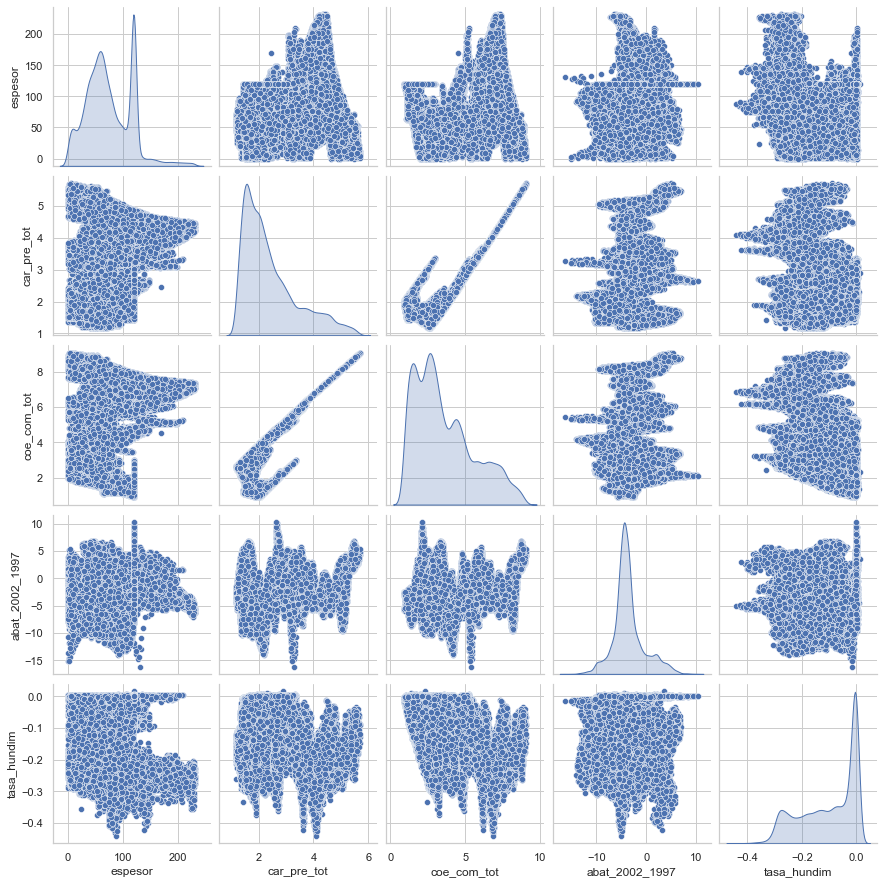

In [7]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [8]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,43805.0,74.661430,41.029823,-0.002413,45.252381,67.249251,112.059732,232.044789
car_pre_tot,43805.0,2.412550,1.003493,1.171040,1.639538,2.105729,2.894539,5.713031
coe_com_tot,43805.0,3.603496,1.975340,0.879444,2.025439,3.081556,4.803213,9.069705
abat_2002_1997,43805.0,-3.648216,3.107975,-16.198617,-5.230209,-4.120466,-2.618703,10.305348


In [9]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [10]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [11]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])

#articulos que hablan de las metricas que se pueden plotear y como hacerlo
#https://github.com/keras-team/keras/issues/7947
#https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
#https://stackoverflow.com/questions/41908379/keras-plot-training-validation-and-test-set-accuracy
  
    #optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer='adam',
                #optimizer=optimizer,
                #metrics=['mae','mse',msee,rmse, r_square,r_square_loss])
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

#crear el modelo
EPOCHS = 5000

model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

#el error de deprecated, documentación para arreglarlo despues
#https://github.com/adriangb/scikeras
#https://colab.research.google.com/github/adriangb/scikeras/blob/docs-deploy/refs/heads/master/notebooks/Basic_Usage.ipynb#scrollTo=fcf3d149
#https://coderzcolumn.com/tutorials/artifical-intelligence/scikeras-give-scikit-learn-like-api-to-your-keras-networks
#https://www.adriangb.com/scikeras/stable/

In [12]:
#ver el resumen de la red
#model.summary()

In [13]:
#volver un archivo de pandas una de las salidas de la variable history
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.002216,0.032618,0.002216,0.778910,0.221090,0.001478,0.024562,0.001478,0.853069,0.146931,4995
4996,0.002219,0.032273,0.002219,0.779483,0.220517,0.001481,0.024675,0.001481,0.852851,0.147149,4996
4997,0.002224,0.032471,0.002224,0.779158,0.220842,0.001523,0.025275,0.001523,0.848548,0.151452,4997
4998,0.002148,0.031727,0.002148,0.784231,0.215769,0.001447,0.024517,0.001447,0.856332,0.143668,4998
4999,0.002247,0.032571,0.002247,0.775760,0.224240,0.001514,0.025161,0.001514,0.849554,0.150446,4999


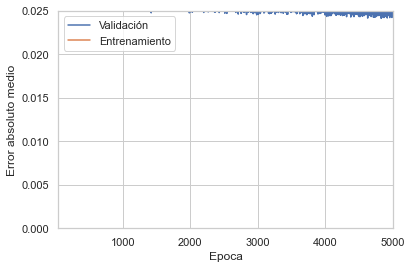

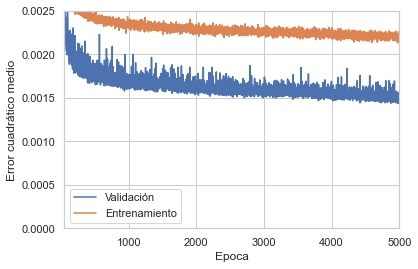

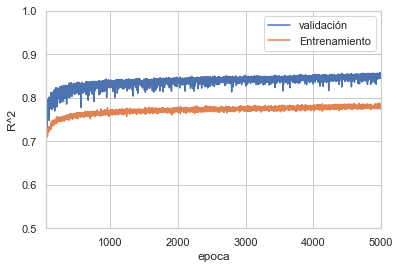

In [14]:
#función para plotear los datos del entrenamiento
plot_history(history)

In [15]:
# summarize history loss . igual que el mse
print(history.history.keys())
#plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
#plt.title('model loss')
#plt.ylabel('loss')
#plt.xlabel('epoch')
#plt.legend(['train', 'dev'], loc='upper left')
#plt.show()

dict_keys(['loss', 'mae', 'mse', 'r_square', 'r_square_loss', 'val_loss', 'val_mae', 'val_mse', 'val_r_square', 'val_r_square_loss'])


In [16]:
# Batchnormalization en todas las capas, y normalización normal a la entrada
def build_model2():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
    
  return model
EPOCHS = 5000
model2 = KerasRegressor(build_fn=build_model2, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history2 = model2.fit(normed_train_data, train_labels)

In [17]:
hist = pd.DataFrame(history2.history)
hist['epoch'] = history2.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.002199,0.031594,0.002199,0.781121,0.218879,0.001607,0.026161,0.001607,0.840021,0.159979,4995
4996,0.002198,0.031394,0.002198,0.782322,0.217679,0.001443,0.024584,0.001443,0.856250,0.143750,4996
4997,0.002168,0.031348,0.002168,0.784972,0.215028,0.001431,0.024216,0.001431,0.857652,0.142348,4997
4998,0.002181,0.031350,0.002181,0.782414,0.217586,0.001463,0.024260,0.001463,0.854453,0.145547,4998
4999,0.002187,0.031541,0.002187,0.782906,0.217094,0.001495,0.024842,0.001495,0.851343,0.148657,4999


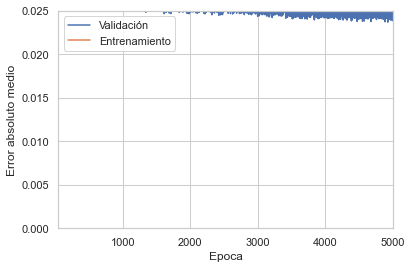

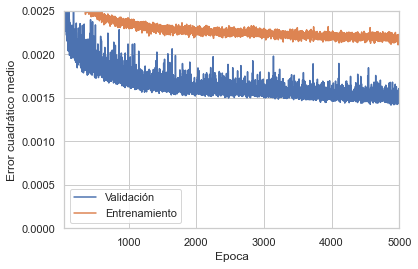

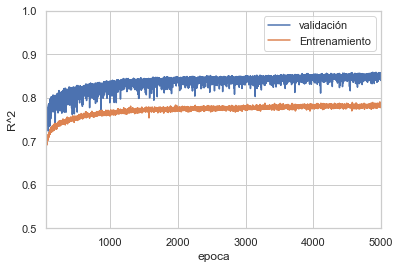

In [18]:
plot_history(history2)

In [19]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [20]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000670,0.016766,0.000670,0.933507,0.066493,0.000803,0.017689,0.000803,0.919568,0.080431,4995
4996,0.000678,0.016865,0.000678,0.932544,0.067456,0.000798,0.017810,0.000798,0.920010,0.079990,4996
4997,0.000681,0.016961,0.000681,0.932223,0.067778,0.000773,0.017368,0.000773,0.922779,0.077221,4997
4998,0.000661,0.016638,0.000661,0.934418,0.065583,0.000797,0.017547,0.000797,0.920272,0.079729,4998
4999,0.000675,0.016815,0.000675,0.932944,0.067056,0.000811,0.018152,0.000811,0.918862,0.081138,4999


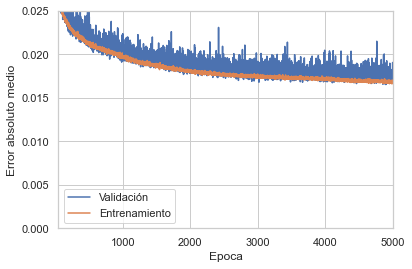

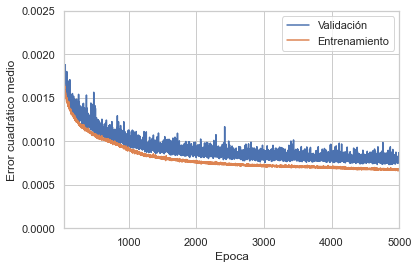

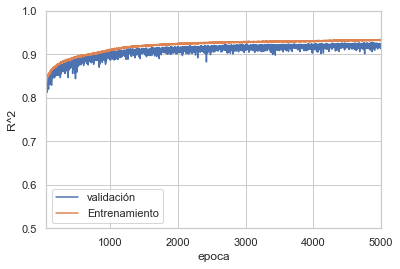

In [21]:
plot_history(history3)

In [22]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(train_dataset))
print(normalizer.mean.numpy())
#github de donde saco esta informacion
#https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/keras/regression.ipynb?hl=fr#scrollTo=GGn-ukwxSPtx

#documentacion de keras
#https://docs.w3cub.com/tensorflow~1.15/keras/layers/layernormalization
#https://keras.io/api/layers/preprocessing_layers/numerical/normalization/#normalization-class

#Articulos diferentes tipos de normalizacion y por que usarla
#https://towardsdatascience.com/different-types-of-normalization-in-tensorflow-dac60396efb0
#https://towardsdatascience.com/different-normalization-layers-in-deep-learning-1a7214ff71d6
#https://www.tensorflow.org/addons/tutorials/layers_normalizations
#https://programmathically.com/feature-scaling-and-data-normalization-for-deep-learning/
#https://machinelearningknowledge.ai/keras-normalization-layers-explained-for-beginners-batch-normalization-vs-layer-normalization/#Layer_Normalization_Layer

#como usar batchnormalization
#https://ichi.pro/es/normalizacion-por-lotes-en-la-practica-un-ejemplo-con-keras-y-tensorflow-2-0-195627853932911

#preprocessing and feature scaling
#https://jonathan-hui.medium.com/tensorflow-keras-preprocessing-layers-dataset-performance-considera-e9fc11de7bc7
#https://keras.io/guides/preprocessing_layers/

[[74.661476   2.4125493  3.603494  -3.6482134]]


In [23]:
# Batchnormalization en todas las capas, y normalización layer a la entrada
def build_model4():
  model = keras.Sequential([
    normalizer,
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model4= KerasRegressor(build_fn=build_model4, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history4= model4.fit(train_dataset, train_labels)

In [24]:
#volver un archivo de pandas una de las salidas de la variable history
hist = pd.DataFrame(history4.history)
hist['epoch'] = history4.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.002116,0.030696,0.002116,0.789567,0.210433,0.001472,0.024677,0.001472,0.853571,0.146429,4995
4996,0.002135,0.030916,0.002135,0.786583,0.213417,0.001509,0.025449,0.001509,0.849482,0.150518,4996
4997,0.002141,0.030851,0.002141,0.786886,0.213114,0.001491,0.024312,0.001491,0.851390,0.148610,4997
4998,0.002108,0.030585,0.002108,0.789597,0.210404,0.001498,0.025675,0.001498,0.850719,0.149281,4998
4999,0.002102,0.030484,0.002102,0.790592,0.209407,0.001498,0.024863,0.001498,0.850948,0.149052,4999


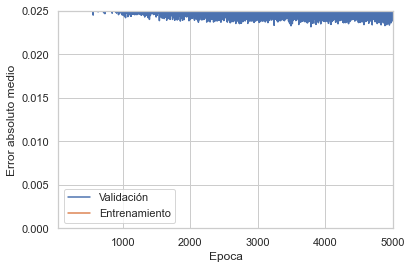

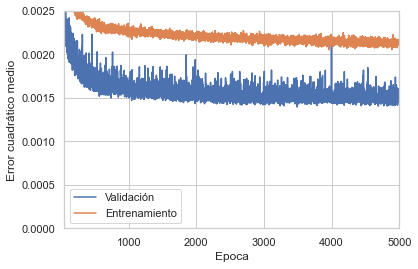

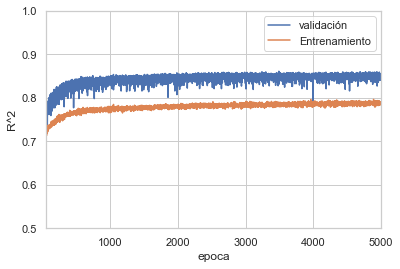

In [25]:
#función para plotear los datos del entrenamiento
plot_history(history4)

In [26]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [27]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.001927,0.028588,0.001927,0.808921,0.191079,0.001388,0.023632,0.001388,0.862141,0.137859,4995
4996,0.001938,0.028525,0.001938,0.806974,0.193026,0.001358,0.023540,0.001358,0.865086,0.134914,4996
4997,0.001924,0.028463,0.001924,0.809006,0.190994,0.001340,0.023442,0.001340,0.867072,0.132929,4997
4998,0.001945,0.028745,0.001945,0.806719,0.193280,0.001333,0.023192,0.001333,0.867844,0.132156,4998
4999,0.001949,0.028640,0.001949,0.806121,0.193879,0.001459,0.024575,0.001459,0.854976,0.145024,4999


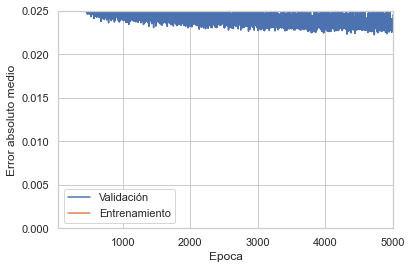

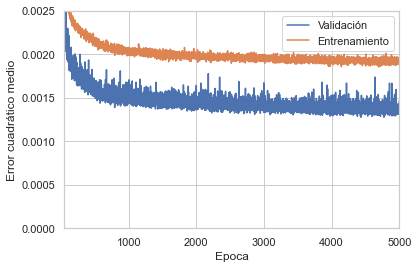

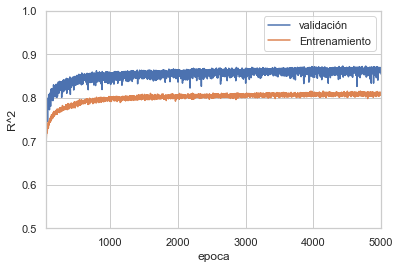

In [28]:
#función para plotear los datos del entrenamiento
plot_history(history5)

(-0.3866097363463181,
 0.09697751279981315,
 -0.49289593396908865,
 0.08770586330182996)

<Figure size 432x288 with 0 Axes>

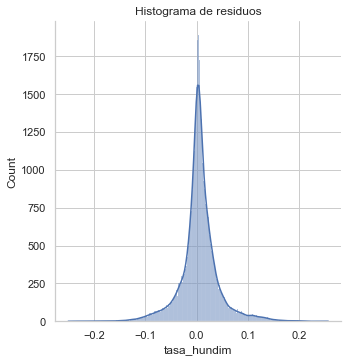

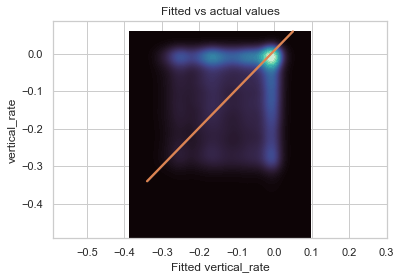

In [29]:
fitted = model.predict(train_dataset)
residuals = train_labels - fitted

# 1. Histogram of residuals
#sns.displot(residuals, col_order=1, kde =True)
plt.figure()
sns.displot(residuals, kde =True)
plt.title('Histograma de residuos')

# Fitted vs residuals
plt.figure()
x1 = pd.Series(fitted, name='Fitted vertical_rate')
x2 = pd.Series(train_labels, name="vertical_rate")
sns.kdeplot(x=x1, y=x2, fill=True, thresh=0, levels=100, cmap="mako" )
sns.regplot(x=x1,y=x2, scatter=False)
plt.title('Fitted vs actual values')
plt.axis('equal')
#sns.displot(residuals, col_order=1, kde =True)

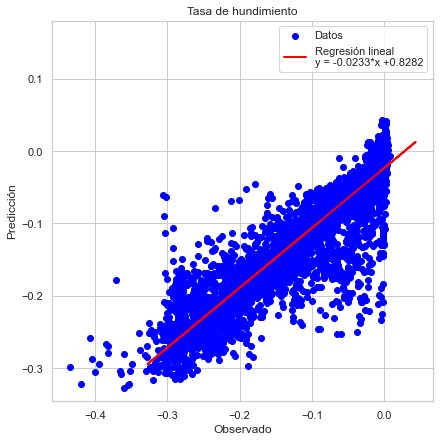

In [30]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

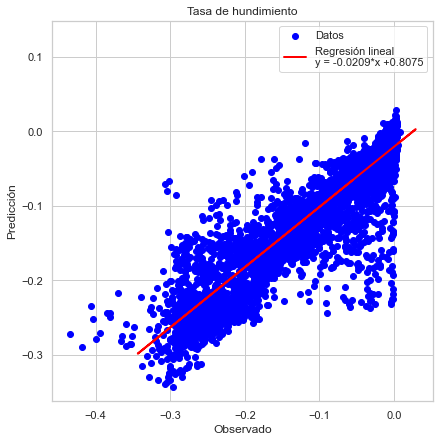

In [31]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model2.predict(normed_test_data))  
y_fit = regressor.predict(model2.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model2.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model2.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

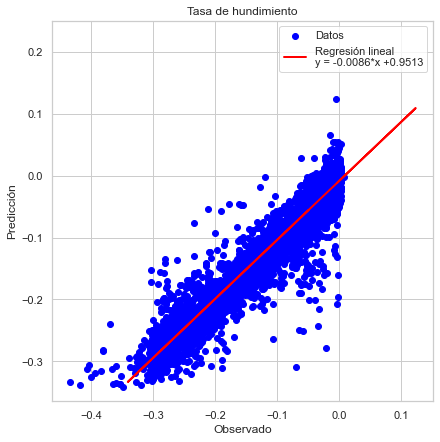

In [32]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

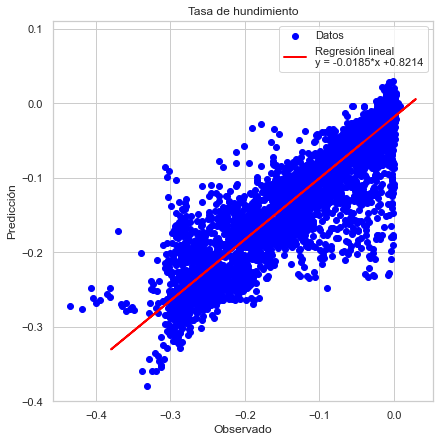

In [33]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model4.predict(test_dataset))  
y_fit = regressor.predict(model4.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model4.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model4.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

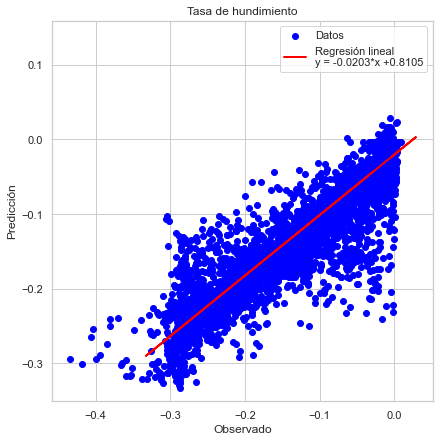

In [34]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [35]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.025852
Mean squared error (MSE):       0.001601
Root mean squared error (RMSE): 0.040012
R square (R^2):                 0.841208


In [36]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model2.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model2.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model2.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model2.predict(normed_test_data)))

Mean absolute error (MAE):      0.025572
Mean squared error (MSE):       0.001639
Root mean squared error (RMSE): 0.040486
R square (R^2):                 0.837425


In [37]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.018291
Mean squared error (MSE):       0.000813
Root mean squared error (RMSE): 0.028506
R square (R^2):                 0.919402


In [38]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model4.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model4.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model4.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model4.predict(test_dataset)))

Mean absolute error (MAE):      0.025884
Mean squared error (MSE):       0.001653
Root mean squared error (RMSE): 0.040660
R square (R^2):                 0.836023


In [39]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.025103
Mean squared error (MSE):       0.001529
Root mean squared error (RMSE): 0.039107
R square (R^2):                 0.848310


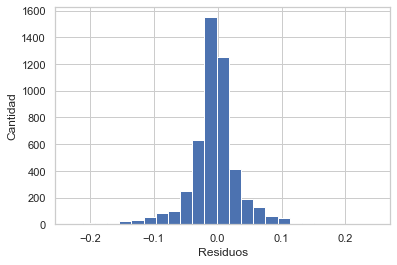

In [40]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

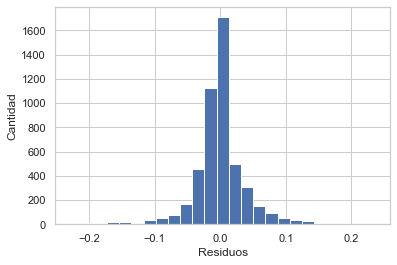

In [41]:
# hisotgrama con los valores de errores
error = model2.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

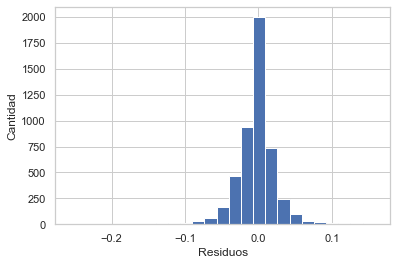

In [42]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

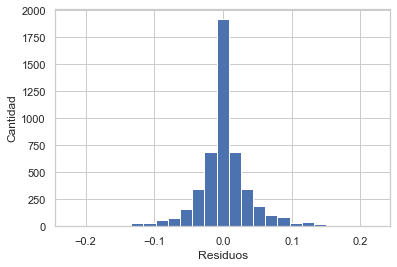

In [43]:
# hisotgrama con los valores de errores
error = model4.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

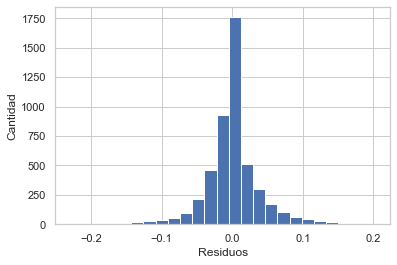

In [44]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [45]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.1679 ± 0.0023,coe_com_tot
0.1486 ± 0.0014,car_pre_tot
0.0045 ± 0.0001,espesor
0.0040 ± 0.0001,abat_2002_1997


In [46]:
perm = PermutationImportance(model2, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.2722 ± 0.0031,coe_com_tot
0.2299 ± 0.0019,car_pre_tot
0.0075 ± 0.0001,espesor
0.0041 ± 0.0000,abat_2002_1997


In [47]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
5.8727 ± 0.0708,coe_com_tot
5.8460 ± 0.0318,car_pre_tot
0.0327 ± 0.0003,espesor
0.0076 ± 0.0001,abat_2002_1997


In [48]:
perm = PermutationImportance(model4, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0592 ± 0.0007,coe_com_tot
0.0357 ± 0.0002,car_pre_tot
0.0046 ± 0.0001,abat_2002_1997
0.0044 ± 0.0001,espesor


In [49]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.1590 ± 0.0011,car_pre_tot
0.1288 ± 0.0022,coe_com_tot
0.0056 ± 0.0001,espesor
0.0046 ± 0.0001,abat_2002_1997


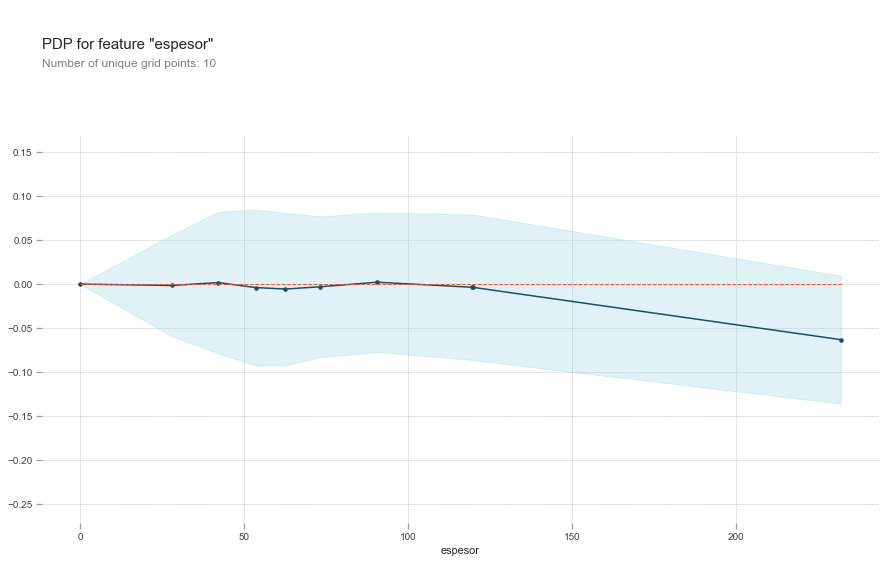

In [50]:
#from pdpbox import pdp, get_dataset, info_plots
# Gather pdp data
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='espesor')
# plot NOX pdp
pdp.pdp_plot(pdp_goals_espesor, 'espesor', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

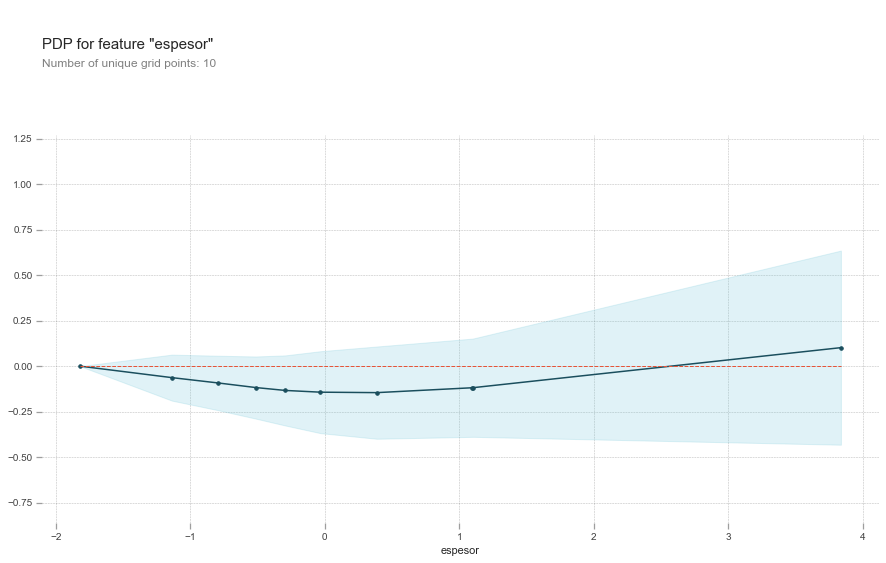

In [51]:
pdp_goals_espesor = pdp.pdp_isolate(model = model3, 
                                dataset = normed_train_data, 
                                model_features = x_label,
                                feature='espesor')
pdp.pdp_plot(pdp_goals_espesor, 'espesor', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

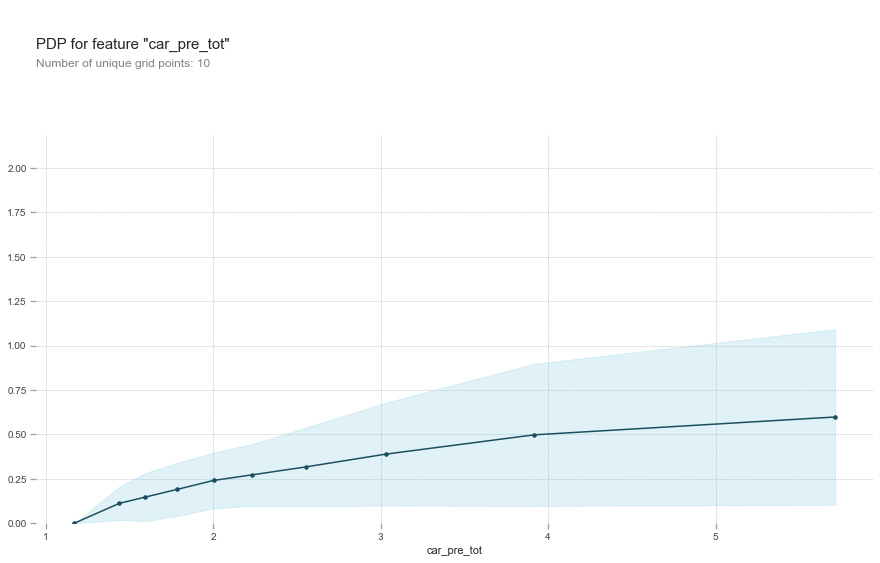

In [52]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='car_pre_tot')
pdp.pdp_plot(pdp_goals_espesor, 'car_pre_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

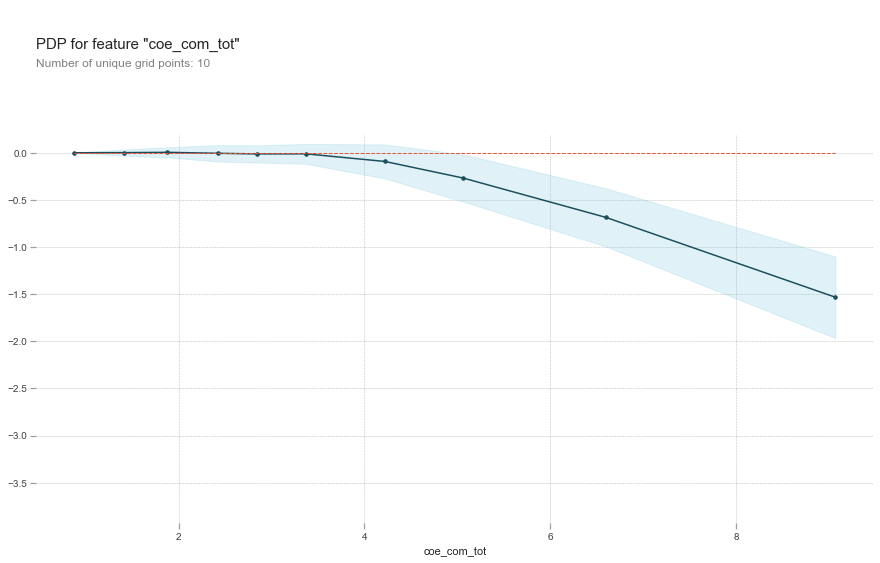

In [53]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='coe_com_tot')
pdp.pdp_plot(pdp_goals_espesor, 'coe_com_tot', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

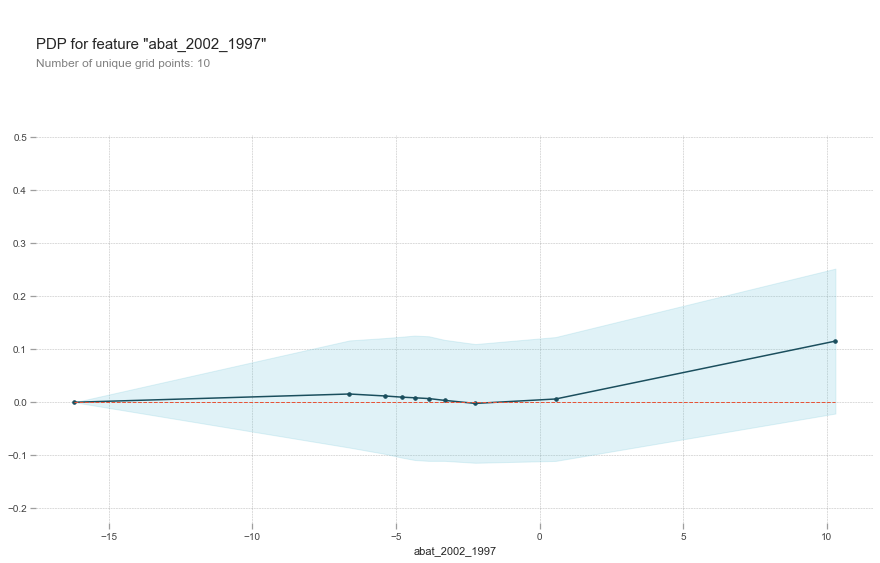

In [54]:
pdp_goals_espesor = pdp.pdp_isolate(model = model, 
                                dataset = train_dataset, 
                                model_features = x_label,
                                feature='abat_2002_1997')
pdp.pdp_plot(pdp_goals_espesor, 'abat_2002_1997', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

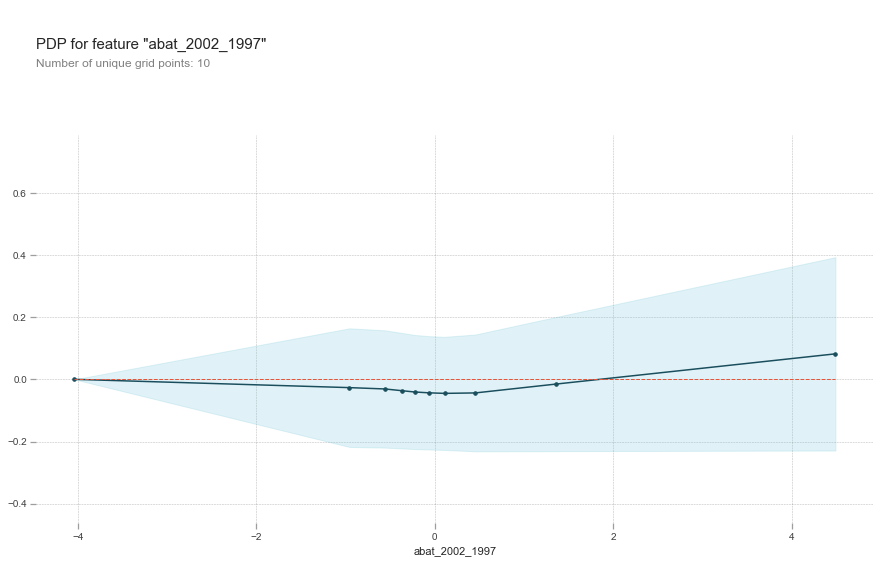

In [55]:
pdp_goals_espesor = pdp.pdp_isolate(model = model3, 
                                dataset = normed_train_data, 
                                model_features = x_label,
                                feature='abat_2002_1997')
pdp.pdp_plot(pdp_goals_espesor, 'abat_2002_1997', 
             x_quantile=False, 
            plot_pts_dist=False)
plt.show()

In [57]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][3] ) / train_stats['std'] [3]

In [58]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2007_2002,abat_2012_2007,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-2.916059,12.137798,3.839227,-0.000975,1.104997,0.922307,-0.332832,1.685436,-0.003542,0.002566
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,-2.569352,11.056859,3.719560,0.000356,1.105051,0.912888,-0.337879,1.740576,-0.002315,0.002670
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-3.575232,14.044859,4.455206,-0.001123,1.105148,0.955286,-0.311454,1.516123,-0.007284,0.006161
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-3.288379,13.030405,4.412997,-0.001897,1.105088,0.945779,-0.316641,1.575017,-0.006053,0.004156
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-2.971849,11.964030,4.347893,-0.000145,1.105114,0.936330,-0.321741,1.634972,-0.004805,0.004660


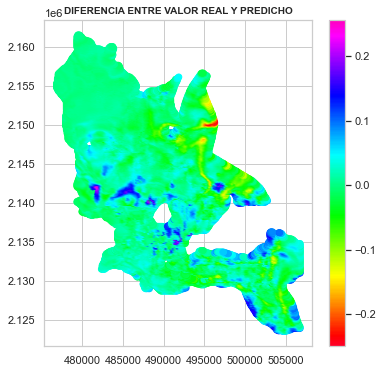

In [59]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [60]:
dataset_fal2['prediction'] = model2.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2007_2002,abat_2012_2007,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-2.916059,12.137798,3.839227,-0.000975,1.104997,0.922307,-0.332832,1.685436,0.006119,-0.007095
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,-2.569352,11.056859,3.719560,0.000356,1.105051,0.912888,-0.337879,1.740576,0.006648,-0.006292
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-3.575232,14.044859,4.455206,-0.001123,1.105148,0.955286,-0.311454,1.516123,0.004793,-0.005916
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-3.288379,13.030405,4.412997,-0.001897,1.105088,0.945779,-0.316641,1.575017,0.005173,-0.007071
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-2.971849,11.964030,4.347893,-0.000145,1.105114,0.936330,-0.321741,1.634972,0.005557,-0.005702


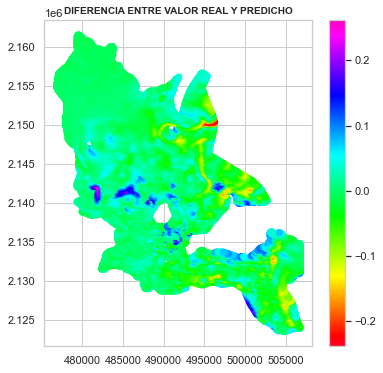

In [61]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()
#segundo peor

In [62]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2007_2002,abat_2012_2007,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-2.916059,12.137798,3.839227,-0.000975,1.104997,0.922307,-0.332832,1.685436,-0.002361,0.001386
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,-2.569352,11.056859,3.719560,0.000356,1.105051,0.912888,-0.337879,1.740576,-0.002361,0.002717
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-3.575232,14.044859,4.455206,-0.001123,1.105148,0.955286,-0.311454,1.516123,-0.002361,0.001238
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-3.288379,13.030405,4.412997,-0.001897,1.105088,0.945779,-0.316641,1.575017,-0.002361,0.000464
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-2.971849,11.964030,4.347893,-0.000145,1.105114,0.936330,-0.321741,1.634972,-0.002361,0.002216


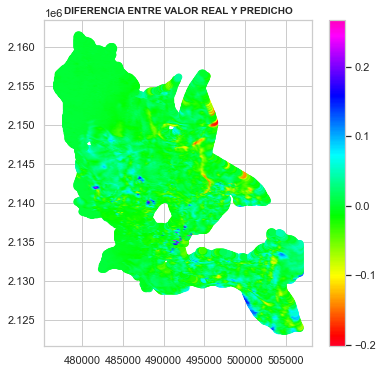

In [63]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [64]:
dataset_fal2['prediction'] = model4.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2007_2002,abat_2012_2007,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-2.916059,12.137798,3.839227,-0.000975,1.104997,0.922307,-0.332832,1.685436,-0.003754,0.002778
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,-2.569352,11.056859,3.719560,0.000356,1.105051,0.912888,-0.337879,1.740576,-0.003754,0.004109
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-3.575232,14.044859,4.455206,-0.001123,1.105148,0.955286,-0.311454,1.516123,-0.003754,0.002631
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-3.288379,13.030405,4.412997,-0.001897,1.105088,0.945779,-0.316641,1.575017,-0.003754,0.001856
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-2.971849,11.964030,4.347893,-0.000145,1.105114,0.936330,-0.321741,1.634972,-0.003754,0.003609


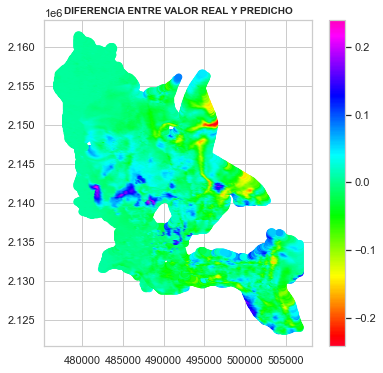

In [65]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()
#el peor

In [66]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2007_2002,abat_2012_2007,abat_2017_2012,tasa_hundim,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
49558,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,-2.916059,12.137798,3.839227,-0.000975,1.104997,0.922307,-0.332832,1.685436,-0.002853,0.001878
49559,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,-2.569352,11.056859,3.719560,0.000356,1.105051,0.912888,-0.337879,1.740576,-0.002853,0.003209
49560,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,-3.575232,14.044859,4.455206,-0.001123,1.105148,0.955286,-0.311454,1.516123,-0.002853,0.001730
49561,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,-3.288379,13.030405,4.412997,-0.001897,1.105088,0.945779,-0.316641,1.575017,-0.002853,0.000956
49562,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,-2.971849,11.964030,4.347893,-0.000145,1.105114,0.936330,-0.321741,1.634972,-0.002853,0.002708


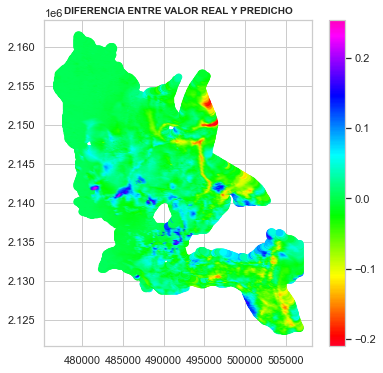

In [67]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Graficas para obtener en google colab

In [ ]:
inter1 = pdp.pdp_interact( 
    model = model3,
    dataset= train_dataset,
    model_features = x_label,
    features = ['espesor', 'coe_com_tot'],
    num_grid_points = [10, 10])

fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out = inter1,
    feature_names=['espesor', 'coe_com_tot'],
    plot_type='contour',
    plot_pdp=False,
    x_quantile=False    
)

In [ ]:
import shap

# SHAP expects model functions to take a 2D numpy array as input, so we define a wrapper function around the original Keras predict function.
def f_wrapper(X):
    return model2.predict(X).flatten()

# Too many input data - use a random slice
# rather than use the whole training set to estimate expected values, we summarize with
# a set of weighted kmeans, each weighted by the number of points they represent.
X_train_summary = shap.kmeans(train_dataset, 20)

# Compute Shap values
explainer = shap.KernelExplainer(f_wrapper,X_train_summary)

# Make plot with combined shap values
# The training set is too big so let's sample it. We get enough point to draw conclusions
#X_train_sample = X_train.sample(400)
shap_values  = explainer.shap_values(train_dataset)
shap.summary_plot(shap_values, train_dataset)

In [ ]:
import xgboost
import shap

# train an XGBoost model
#X, y = shap.datasets.boston()
model = xgboost.XGBRegressor().fit(normed_train_data, train_labels)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(normed_train_data)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [ ]:
shap.plots.bar(shap_values)   #buscar si sirve para keras

In [ ]:
# https://github.com/slundberg/shap    # codigo libreria sharp
shap.decision_plot(expected_value, shap_interaction_values[misclassified], features_display[misclassified],link='logit')#ver si sirve con keras
#https://towardsdatascience.com/feature-importance-with-neural-network-346eb6205743   #como funciona la permutacion

In [ ]:
shap.initjs()
explainer = shap.DeepExplainer(model, background)
shap_values = explainer.shap_values(val_x)
shap.summary_plot(shap_values, train_x, plot_type="bar", matplotlib=True)    #prueba con error

In [ ]:
import shap

# Predecir con coeficientes totales año 1997 - 2002 recortado

In [68]:
# Año 1997 - 2002, coef. totales zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,abat_2002_1997,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,2.155248,-4.043388,-0.097276
std,37.050136,0.464849,0.795961,2.969185,0.102892
min,0.017483,1.170159,0.879444,-11.381516,-0.375125
25%,47.290563,1.477711,1.505700,-5.417373,-0.175381
50%,67.353762,1.721343,2.116003,-4.380958,-0.065559
75%,119.999996,2.097508,2.673035,-3.311468,-0.001288
max,120.213670,3.371173,5.071804,10.305348,0.014968


In [69]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_tot        0
abat_2002_1997     0
tasa_hundim       59
dtype: int64

In [70]:
#eliminar los registros vacios
dataset = dataset.dropna()

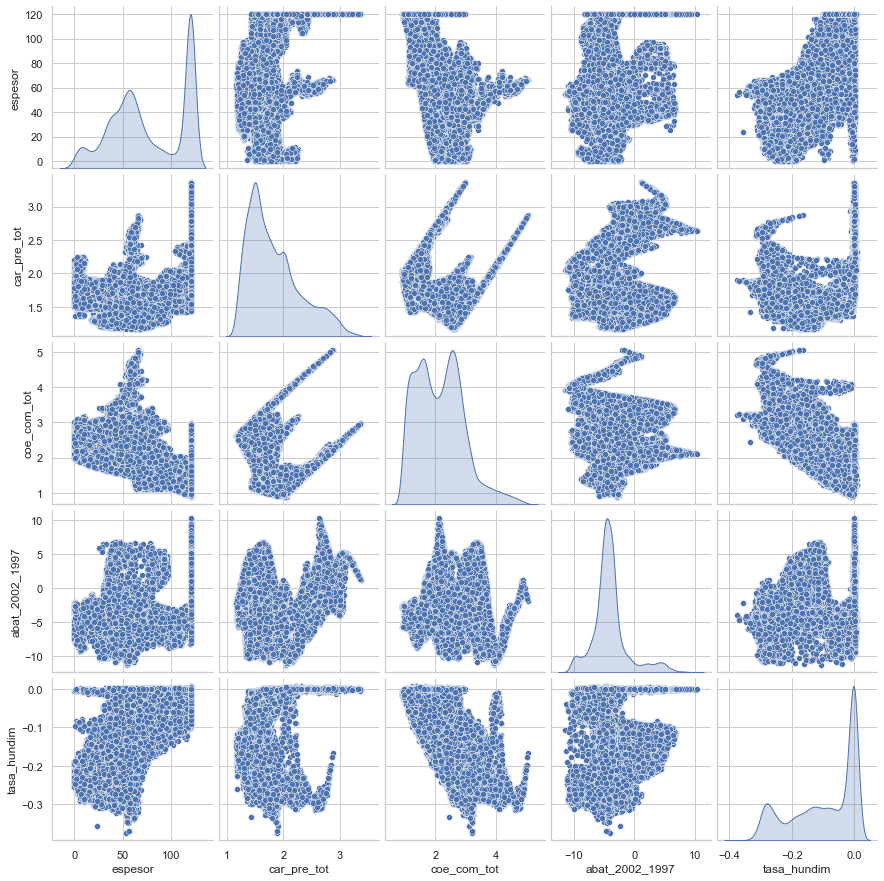

In [71]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [72]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_tot,23433.0,2.154213,0.793985,0.879444,1.507328,2.116764,2.671197,5.071804
abat_2002_1997,23433.0,-4.041236,2.965039,-11.352502,-5.411213,-4.373834,-3.310608,10.305348


In [73]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [74]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [75]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                #optimizer=optimizer,
                #metrics=['mae','mse',msee,rmse, r_square,r_square_loss])
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [76]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000808,0.018793,0.000808,0.922508,0.077492,0.000587,0.014197,0.000587,0.942169,0.057831,4995
4996,0.000808,0.018684,0.000808,0.921582,0.078418,0.000525,0.013668,0.000525,0.948377,0.051623,4996
4997,0.000779,0.018475,0.000779,0.924682,0.075318,0.000580,0.012831,0.000580,0.942717,0.057283,4997
4998,0.000885,0.019599,0.000885,0.913247,0.086753,0.000723,0.015849,0.000723,0.928389,0.071611,4998
4999,0.000776,0.018296,0.000776,0.924724,0.075276,0.000496,0.012387,0.000496,0.951409,0.048592,4999


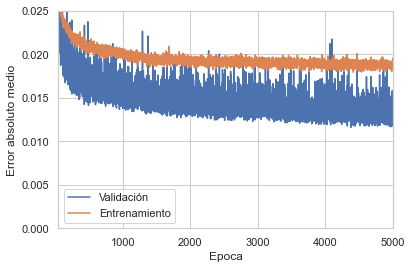

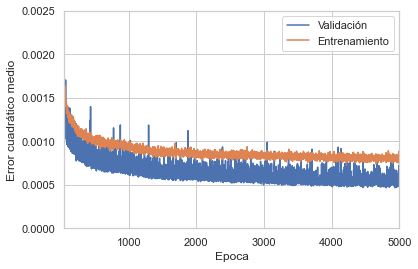

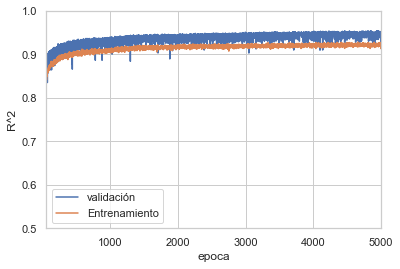

In [77]:
plot_history(history)

In [78]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [79]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000149,0.007635,0.000149,0.985558,0.014442,0.000220,0.008969,0.000220,0.978667,0.021334,4995
4996,0.000143,0.007314,0.000143,0.986210,0.013790,0.000200,0.007856,0.000200,0.980638,0.019362,4996
4997,0.000148,0.007481,0.000148,0.985714,0.014286,0.000213,0.008551,0.000213,0.979294,0.020706,4997
4998,0.000148,0.007575,0.000148,0.985627,0.014373,0.000218,0.007941,0.000218,0.978695,0.021305,4998
4999,0.000149,0.007528,0.000149,0.985662,0.014338,0.000200,0.008120,0.000200,0.980443,0.019558,4999


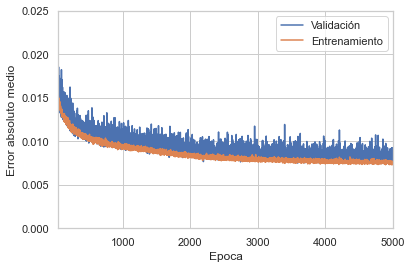

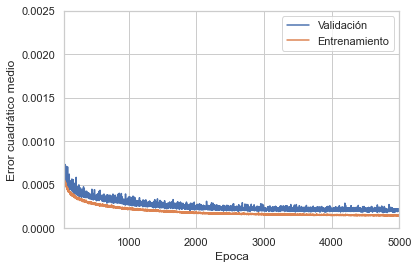

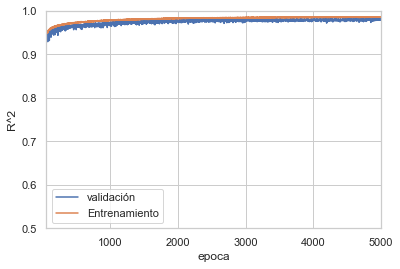

In [80]:
plot_history(history3)

In [81]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [82]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000649,0.015033,0.000649,0.937158,0.062842,0.000547,0.014034,0.000547,0.946787,0.053213,4995
4996,0.000638,0.014992,0.000638,0.938461,0.061539,0.000474,0.012253,0.000474,0.953923,0.046077,4996
4997,0.000665,0.015354,0.000665,0.935686,0.064314,0.000498,0.012421,0.000498,0.952015,0.047985,4997
4998,0.000673,0.015192,0.000673,0.935146,0.064854,0.000511,0.012401,0.000511,0.950329,0.049671,4998
4999,0.000658,0.015262,0.000658,0.936410,0.063590,0.000488,0.012199,0.000488,0.952310,0.047690,4999


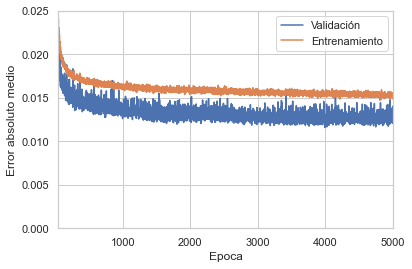

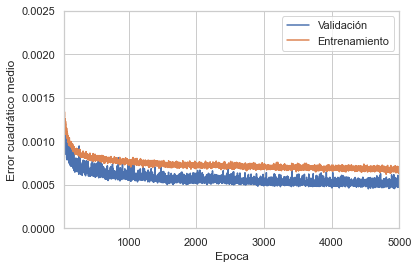

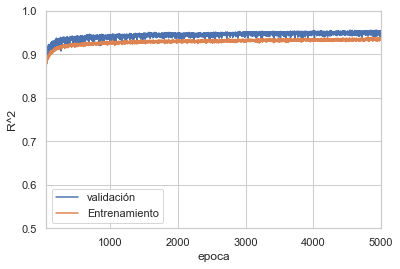

In [83]:
plot_history(history5)

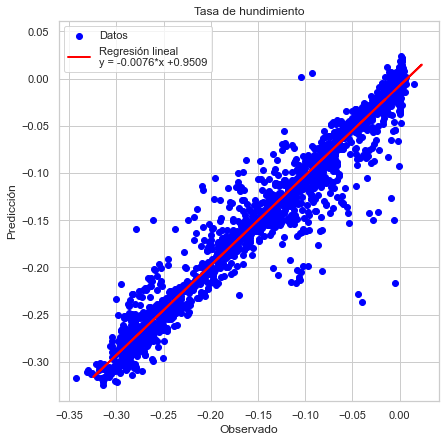

In [84]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

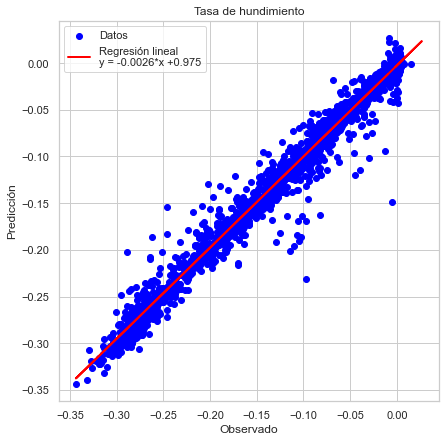

In [85]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

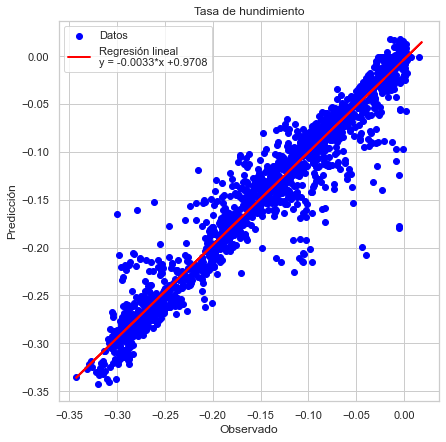

In [86]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [87]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.012109
Mean squared error (MSE):       0.000440
Root mean squared error (RMSE): 0.020983
R square (R^2):                 0.958639


In [88]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.007764
Mean squared error (MSE):       0.000174
Root mean squared error (RMSE): 0.013176
R square (R^2):                 0.983691


In [89]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.011578
Mean squared error (MSE):       0.000415
Root mean squared error (RMSE): 0.020360
R square (R^2):                 0.961058


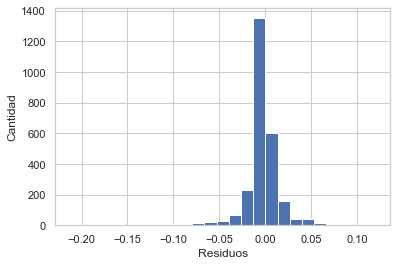

In [90]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

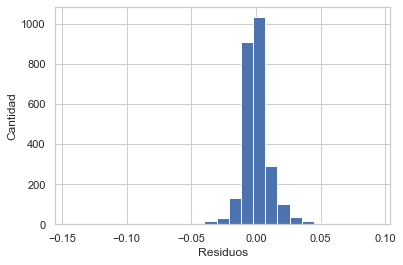

In [91]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

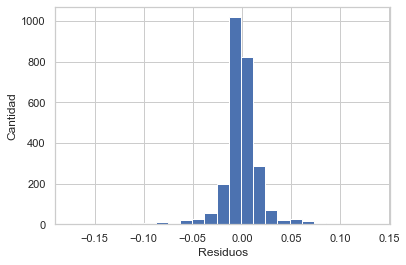

In [92]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [93]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0182 ± 0.0005,car_pre_tot
0.0158 ± 0.0004,coe_com_tot
0.0064 ± 0.0001,espesor
0.0030 ± 0.0001,abat_2002_1997


In [94]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0437 ± 0.0016,coe_com_tot
0.0232 ± 0.0003,car_pre_tot
0.0096 ± 0.0003,espesor
0.0053 ± 0.0001,abat_2002_1997


In [95]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0158 ± 0.0005,coe_com_tot
0.0132 ± 0.0003,car_pre_tot
0.0067 ± 0.0001,espesor
0.0038 ± 0.0001,abat_2002_1997


In [96]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][3] ) / train_stats['std'] [3]

In [97]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,1.899237,-0.005798,0.004823
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,1.957035,-0.005798,0.006154
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,1.721763,-0.005798,0.004676
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,1.783496,-0.005798,0.003901
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,1.846341,-0.005798,0.005654


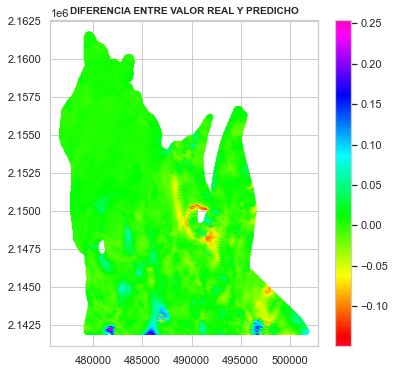

In [98]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [99]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,1.899237,-0.003631,0.002656
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,1.957035,-0.002315,0.002670
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,1.721763,-0.000696,-0.000427
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,1.783496,-0.001889,-0.000008
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,1.846341,-0.002780,0.002635


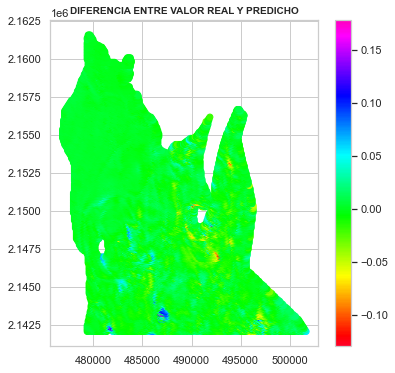

In [100]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [101]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,1.899237,-0.001153,0.000178
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,1.957035,-0.001153,0.001509
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,1.721763,-0.001153,0.000031
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,1.783496,-0.001153,-0.000744
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,1.846341,-0.001153,0.001009


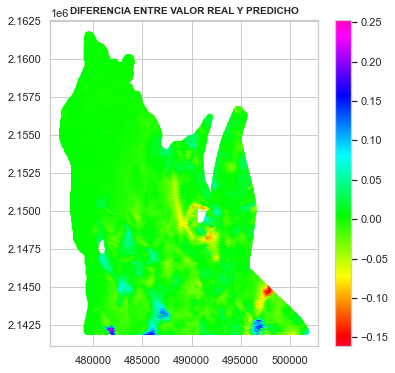

In [102]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes separados año 1997 - 2002 recortado

In [103]:
# Año 1997 - 2002, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_sup,car_pre_dur,car_pre_inf,coe_com_sup,coe_com_dur,coe_com_inf,abat_2002_1997,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.309379,2.507129,2.495002,1.957480,0.152980,0.669202,-4.043388,-0.097276
std,37.050136,0.335447,0.276869,0.560262,1.038798,0.037726,0.223064,2.969185,0.102892
min,0.017483,0.888549,1.915386,1.504945,0.023132,0.066877,0.072937,-11.381516,-0.375125
25%,47.290563,0.960724,2.280297,2.046927,1.064652,0.133699,0.493539,-5.417373,-0.175381
50%,67.353762,1.304631,2.465800,2.287142,1.864751,0.148754,0.660574,-4.380958,-0.065559
75%,119.999996,1.613403,2.697182,2.961173,3.050305,0.172016,0.809236,-3.311468,-0.001288
max,120.213670,2.083252,3.540976,4.061701,3.315095,0.341208,1.466186,10.305348,0.014968


In [104]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_sup        0
car_pre_dur        0
car_pre_inf        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2002_1997     0
tasa_hundim       59
dtype: int64

In [105]:
#eliminar los registros vacios
dataset = dataset.dropna()

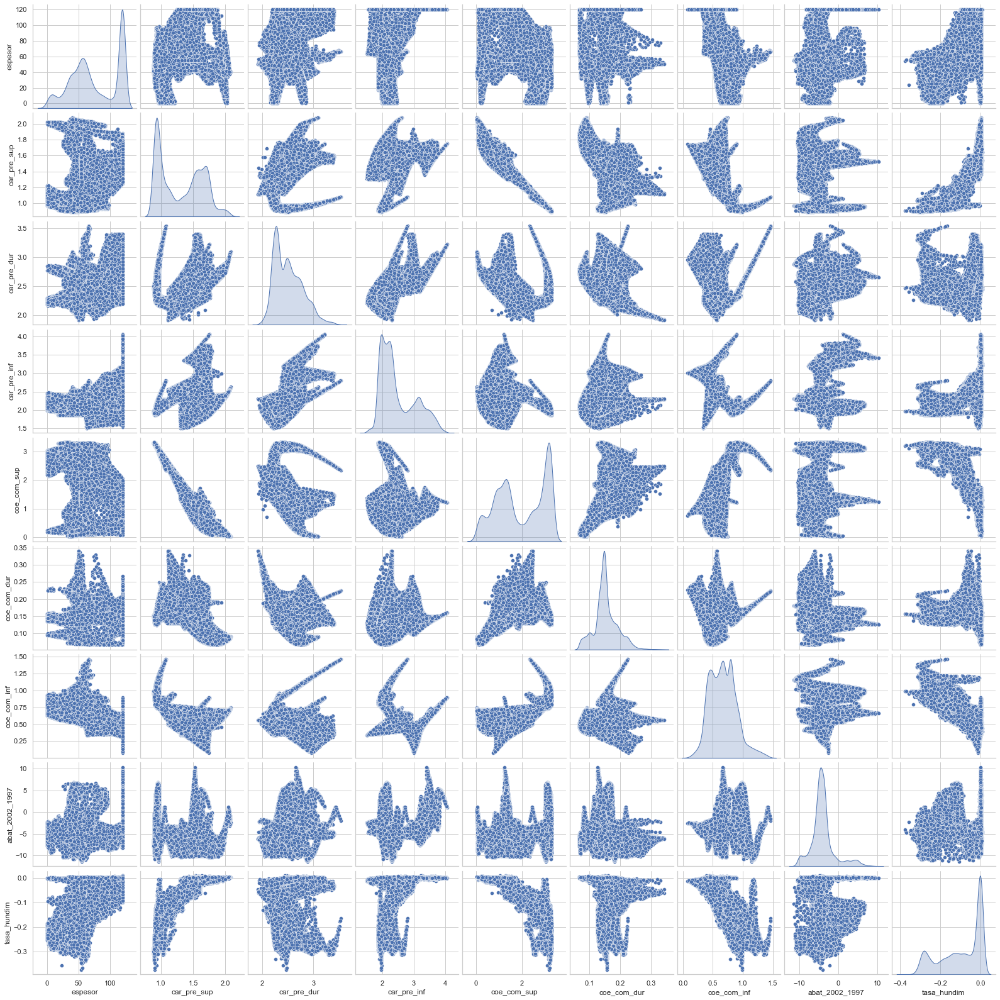

In [106]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997','tasa_hundim']], diag_kind="kde")

In [107]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_sup,23433.0,1.309489,0.335632,0.888549,0.960704,1.304419,1.613111,2.083252
car_pre_dur,23433.0,2.506414,0.276816,1.915386,2.279939,2.465496,2.694900,3.540976
car_pre_inf,23433.0,2.492233,0.558869,1.504945,2.045394,2.286791,2.951977,4.061701
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2002_1997,23433.0,-4.041236,2.965039,-11.352502,-5.411213,-4.373834,-3.310608,10.305348


In [108]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [109]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [110]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                #optimizer=optimizer,
                #metrics=['mae','mse',msee,rmse, r_square,r_square_loss])
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [111]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000213,0.010631,0.000213,0.979325,0.020675,0.000092,0.006019,0.000092,0.991106,0.008894,4995
4996,0.000227,0.011215,0.000227,0.977953,0.022047,0.000126,0.007956,0.000126,0.987756,0.012244,4996
4997,0.000202,0.010350,0.000202,0.980365,0.019635,0.000107,0.005676,0.000107,0.989725,0.010275,4997
4998,0.000236,0.011172,0.000236,0.976900,0.023101,0.000100,0.006367,0.000100,0.990368,0.009632,4998
4999,0.000227,0.011183,0.000227,0.977677,0.022323,0.000066,0.004718,0.000066,0.993617,0.006383,4999


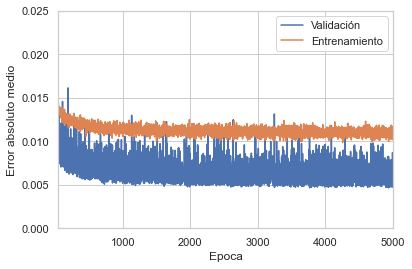

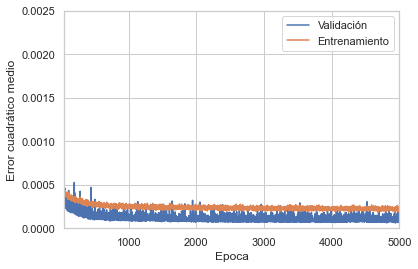

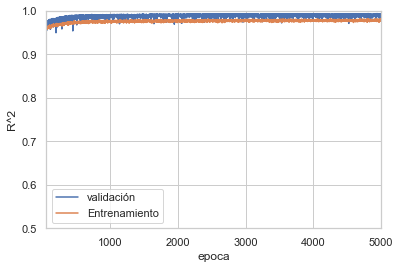

In [112]:
plot_history(history)

In [113]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [114]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000044,0.003917,0.000044,0.995746,0.004254,0.000053,0.004061,0.000053,0.994883,0.005117,4995
4996,0.000043,0.003800,0.000043,0.995877,0.004123,0.000055,0.004306,0.000055,0.994699,0.005302,4996
4997,0.000042,0.003801,0.000042,0.995924,0.004076,0.000054,0.004065,0.000054,0.994752,0.005248,4997
4998,0.000045,0.003935,0.000045,0.995605,0.004395,0.000061,0.005119,0.000061,0.994117,0.005883,4998
4999,0.000044,0.003852,0.000044,0.995775,0.004224,0.000055,0.004084,0.000055,0.994684,0.005316,4999


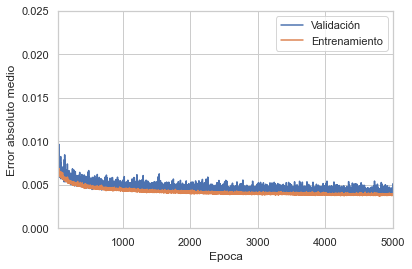

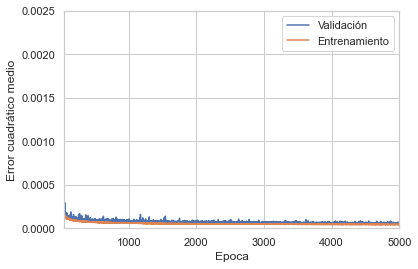

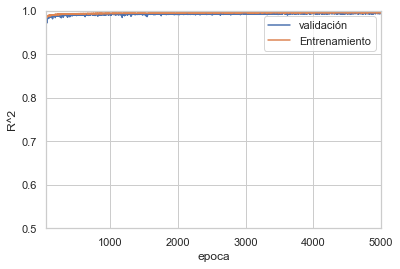

In [115]:
plot_history(history3)

In [116]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [117]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000117,0.006353,0.000117,0.988593,0.011407,0.000106,0.005766,0.000106,0.989933,0.010067,4995
4996,0.000115,0.006418,0.000115,0.988790,0.011210,0.000134,0.005976,0.000134,0.987247,0.012754,4996
4997,0.000109,0.006243,0.000109,0.989424,0.010576,0.000075,0.004911,0.000075,0.992624,0.007375,4997
4998,0.000106,0.006246,0.000106,0.989676,0.010324,0.000111,0.006888,0.000111,0.989320,0.010680,4998
4999,0.000117,0.006546,0.000117,0.988751,0.011249,0.000123,0.006396,0.000123,0.988298,0.011702,4999


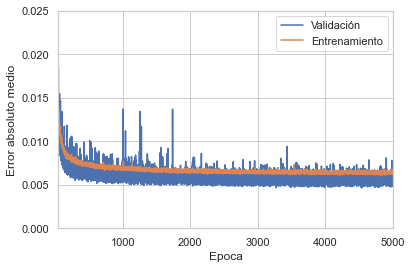

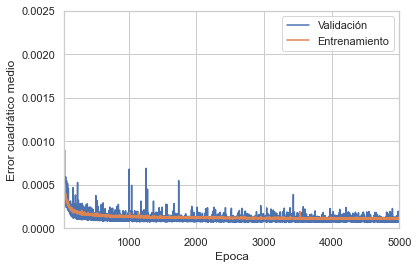

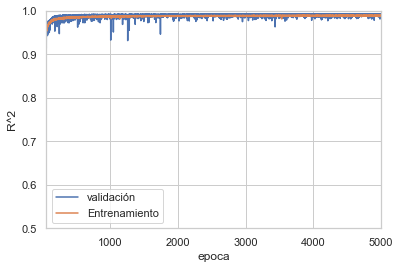

In [118]:
plot_history(history5)

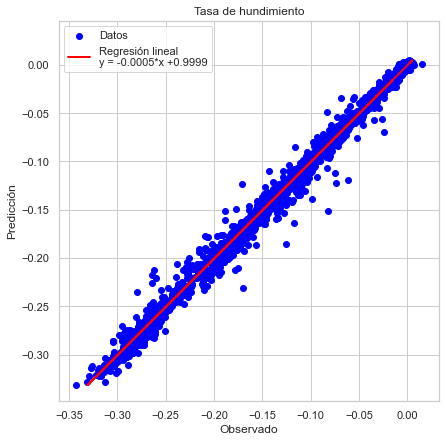

In [119]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

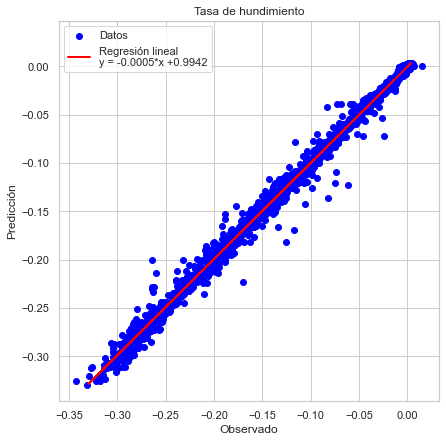

In [120]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

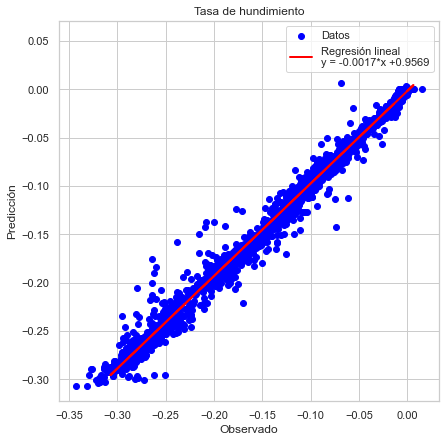

In [121]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [122]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.004455
Mean squared error (MSE):       0.000056
Root mean squared error (RMSE): 0.007461
R square (R^2):                 0.994771


In [123]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.003803
Mean squared error (MSE):       0.000043
Root mean squared error (RMSE): 0.006585
R square (R^2):                 0.995927


In [124]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.006122
Mean squared error (MSE):       0.000111
Root mean squared error (RMSE): 0.010549
R square (R^2):                 0.989546


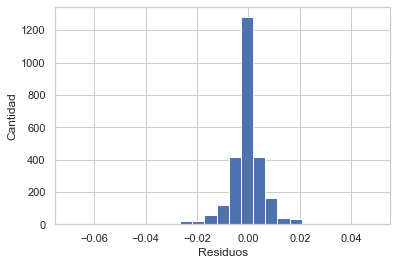

In [125]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

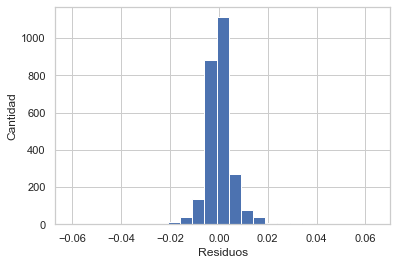

In [126]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

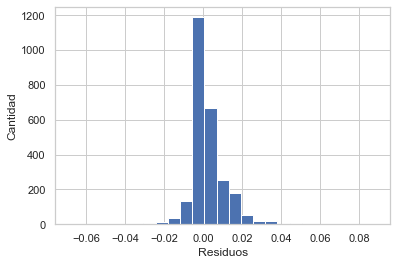

In [127]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [128]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0701 ± 0.0012,coe_com_sup
0.0577 ± 0.0009,car_pre_sup
0.0345 ± 0.0012,car_pre_inf
0.0092 ± 0.0001,coe_com_inf
0.0041 ± 0.0000,espesor
0.0017 ± 0.0001,coe_com_dur
0.0015 ± 0.0000,car_pre_dur
0.0004 ± 0.0000,abat_2002_1997


In [129]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0491 ± 0.0019,coe_com_sup
0.0301 ± 0.0020,coe_com_inf
0.0135 ± 0.0003,coe_com_dur
0.0128 ± 0.0003,car_pre_inf
0.0114 ± 0.0002,car_pre_sup
0.0079 ± 0.0003,car_pre_dur
0.0022 ± 0.0000,espesor
0.0011 ± 0.0001,abat_2002_1997


In [130]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.2719 ± 0.0040,car_pre_sup
0.2142 ± 0.0031,coe_com_sup
0.0079 ± 0.0003,car_pre_inf
0.0036 ± 0.0001,car_pre_dur
0.0034 ± 0.0001,coe_com_inf
0.0029 ± 0.0000,espesor
0.0016 ± 0.0001,coe_com_dur
0.0007 ± 0.0000,abat_2002_1997


In [131]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_sup_nor'] = ( dataset_fal2['car_pre_sup'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['car_pre_dur_nor'] = ( dataset_fal2['car_pre_dur'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['car_pre_inf_nor'] = ( dataset_fal2['car_pre_inf'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][5] ) / train_stats['std'] [5]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][6] ) / train_stats['std'] [6]
dataset_fal2['abat_2002_1997_nor'] = ( dataset_fal2['abat_2002_1997'] - train_stats['mean'][7] ) / train_stats['std'] [7]


In [132]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.899237,0.001910,-0.002885
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.957035,0.002075,-0.001719
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.721763,0.001562,-0.002685
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.783496,0.001655,-0.003552
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.846341,0.001829,-0.001974


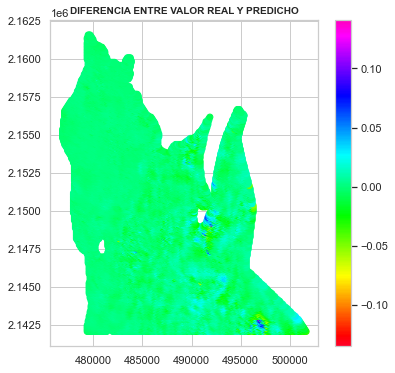

In [133]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [134]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_sup_nor','car_pre_dur_nor','car_pre_inf_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2002_1997_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.899237,0.000301,-0.001277
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.957035,-0.000203,0.000558
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.721763,0.001642,-0.002765
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.783496,0.001120,-0.003017
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.846341,0.000560,-0.000705


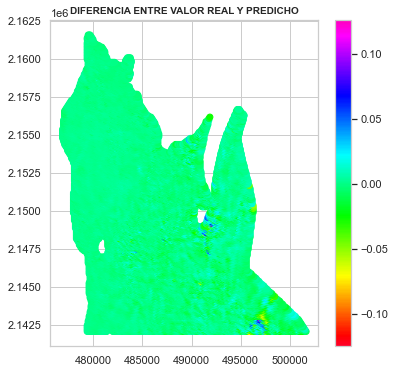

In [135]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [136]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2002_1997']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2002_1997_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.899237,-0.000034,-0.000941
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.957035,-0.000034,0.000390
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.721763,-0.000034,-0.001089
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.783496,-0.000034,-0.001863
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.846341,-0.000034,-0.000111


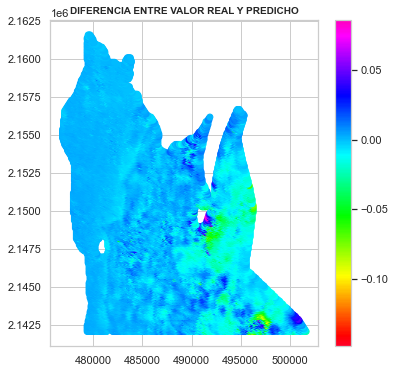

In [137]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes separados año 2002 - 2007 recortado

In [138]:
# Año 2002 - 2007, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_sup,car_pre_dur,car_pre_inf,coe_com_sup,coe_com_dur,coe_com_inf,abat_2007_2002,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.309379,2.507129,2.495002,1.957480,0.152980,0.669202,-2.095210,-0.097276
std,37.050136,0.335447,0.276869,0.560262,1.038798,0.037726,0.223064,3.976424,0.102892
min,0.017483,0.888549,1.915386,1.504945,0.023132,0.066877,0.072937,-22.778658,-0.375125
25%,47.290563,0.960724,2.280297,2.046927,1.064652,0.133699,0.493539,-4.046187,-0.175381
50%,67.353762,1.304631,2.465800,2.287142,1.864751,0.148754,0.660574,-2.478798,-0.065559
75%,119.999996,1.613403,2.697182,2.961173,3.050305,0.172016,0.809236,0.165508,-0.001288
max,120.213670,2.083252,3.540976,4.061701,3.315095,0.341208,1.466186,17.647424,0.014968


In [139]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_sup        0
car_pre_dur        0
car_pre_inf        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2007_2002     0
tasa_hundim       59
dtype: int64

In [140]:
#eliminar los registros vacios
dataset = dataset.dropna()

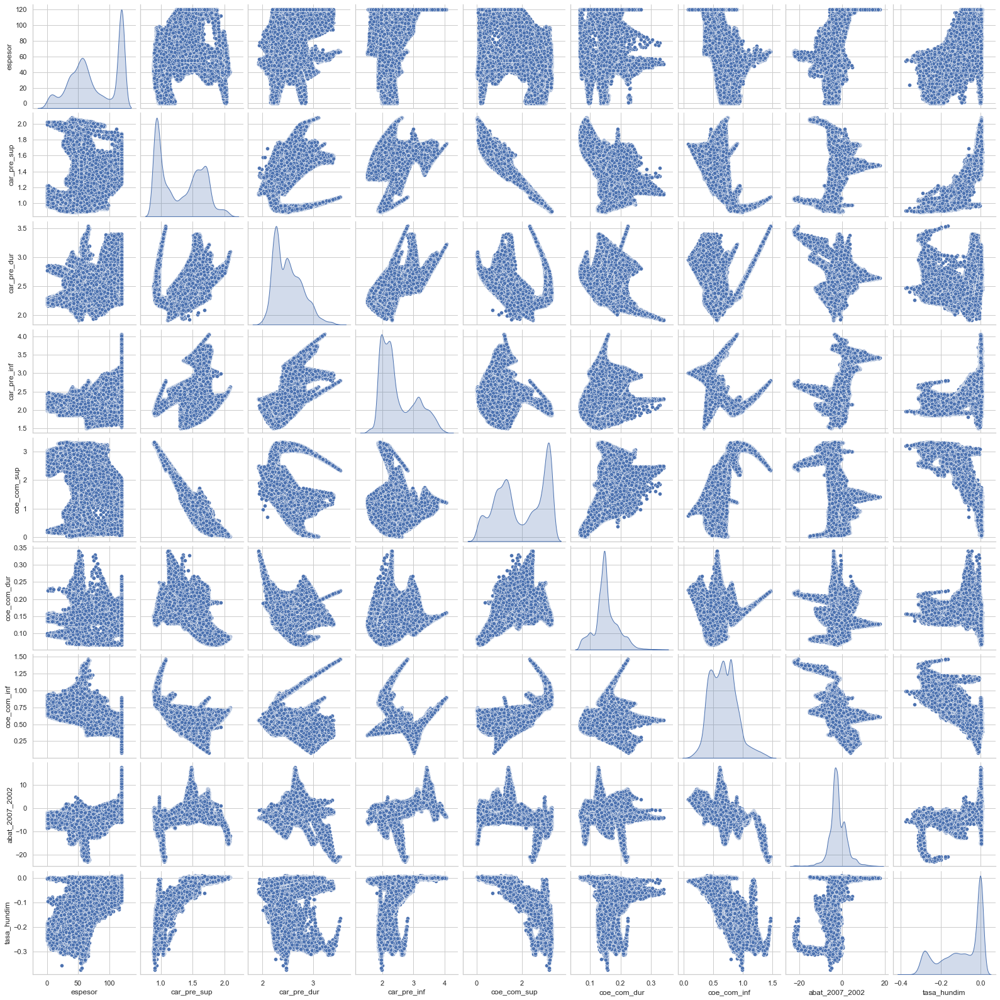

In [141]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002','tasa_hundim']], diag_kind="kde")

In [142]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_sup,23433.0,1.309489,0.335632,0.888549,0.960704,1.304419,1.613111,2.083252
car_pre_dur,23433.0,2.506414,0.276816,1.915386,2.279939,2.465496,2.694900,3.540976
car_pre_inf,23433.0,2.492233,0.558869,1.504945,2.045394,2.286791,2.951977,4.061701
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2007_2002,23433.0,-2.112562,3.975764,-22.753605,-4.063028,-2.500986,0.133106,17.647424


In [143]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [144]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [145]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [146]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000238,0.011281,0.000238,0.976383,0.023617,0.000088,0.005543,0.000088,0.991454,0.008546,4995
4996,0.000236,0.011032,0.000236,0.976540,0.023460,0.000107,0.006189,0.000107,0.989705,0.010295,4996
4997,0.000273,0.011946,0.000273,0.973233,0.026767,0.000085,0.005709,0.000085,0.991715,0.008285,4997
4998,0.000247,0.011376,0.000247,0.975386,0.024614,0.000090,0.005629,0.000090,0.991150,0.008850,4998
4999,0.000226,0.010943,0.000226,0.977679,0.022321,0.000098,0.005458,0.000098,0.990620,0.009380,4999


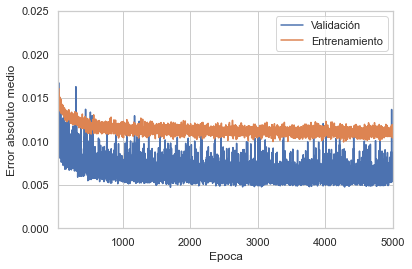

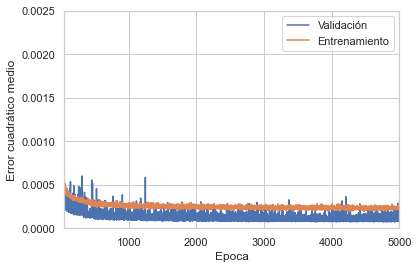

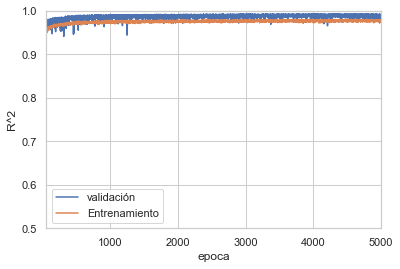

In [147]:
plot_history(history)

In [148]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [149]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000035,0.003557,0.000035,0.996657,0.003344,0.000047,0.003794,0.000047,0.995448,0.004552,4995
4996,0.000033,0.003534,0.000033,0.996800,0.003199,0.000052,0.003929,0.000052,0.994951,0.005049,4996
4997,0.000034,0.003468,0.000034,0.996678,0.003322,0.000047,0.004127,0.000047,0.995486,0.004514,4997
4998,0.000035,0.003591,0.000035,0.996658,0.003342,0.000046,0.003947,0.000046,0.995574,0.004426,4998
4999,0.000034,0.003513,0.000034,0.996689,0.003311,0.000050,0.004311,0.000050,0.995205,0.004795,4999


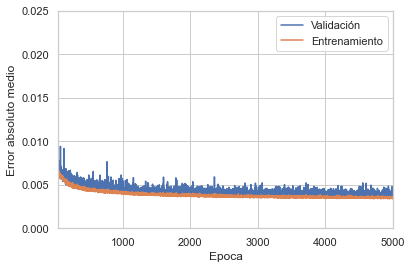

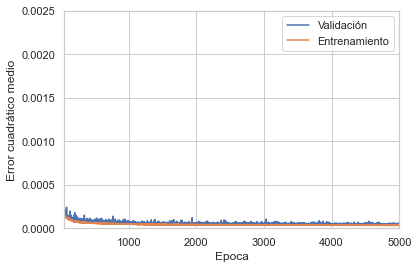

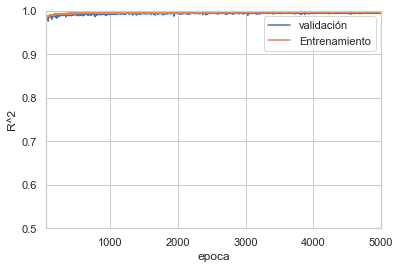

In [150]:
plot_history(history3)

In [151]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [152]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000145,0.007028,0.000145,0.985922,0.014077,0.000097,0.005807,0.000097,0.990624,0.009376,4995
4996,0.000128,0.006767,0.000128,0.987516,0.012485,0.000089,0.005428,0.000089,0.991291,0.008709,4996
4997,0.000142,0.007097,0.000142,0.986206,0.013794,0.000106,0.005655,0.000106,0.989858,0.010142,4997
4998,0.000129,0.006843,0.000129,0.987551,0.012449,0.000076,0.004945,0.000076,0.992635,0.007365,4998
4999,0.000126,0.006700,0.000126,0.987859,0.012141,0.000105,0.005943,0.000105,0.989979,0.010021,4999


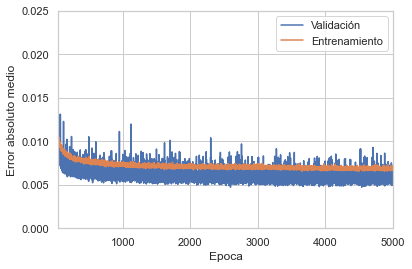

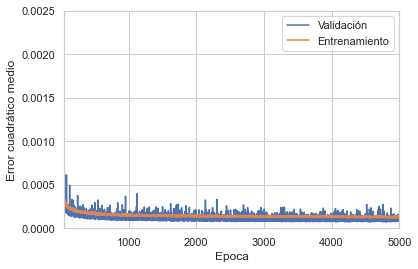

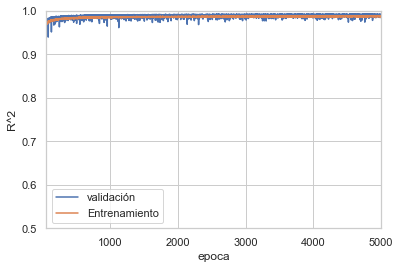

In [153]:
plot_history(history5)

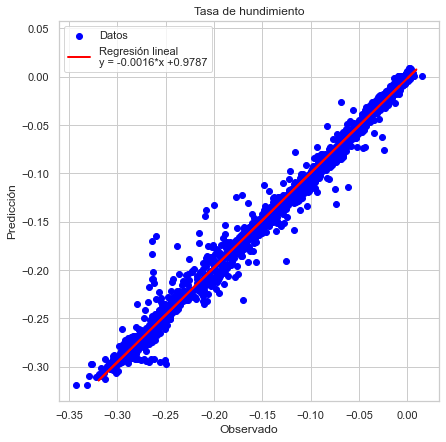

In [154]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

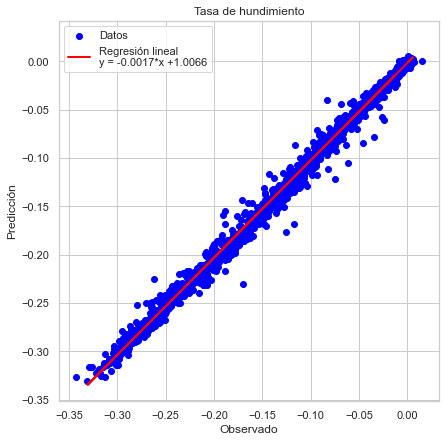

In [155]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

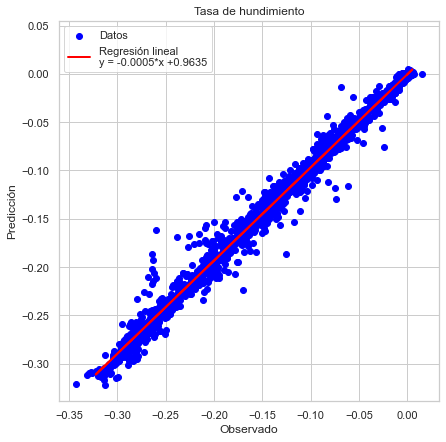

In [156]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [157]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.005324
Mean squared error (MSE):       0.000089
Root mean squared error (RMSE): 0.009428
R square (R^2):                 0.991650


In [158]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.004259
Mean squared error (MSE):       0.000044
Root mean squared error (RMSE): 0.006636
R square (R^2):                 0.995863


In [159]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.005761
Mean squared error (MSE):       0.000096
Root mean squared error (RMSE): 0.009814
R square (R^2):                 0.990952


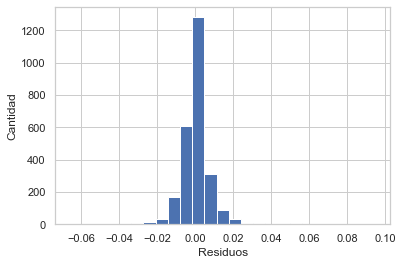

In [160]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

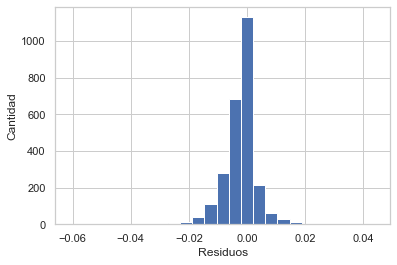

In [161]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

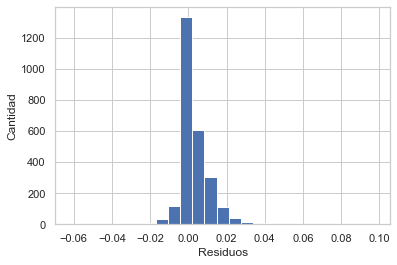

In [162]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [163]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0924 ± 0.0024,car_pre_sup
0.0324 ± 0.0005,coe_com_sup
0.0273 ± 0.0008,car_pre_inf
0.0028 ± 0.0001,coe_com_inf
0.0026 ± 0.0001,espesor
0.0018 ± 0.0001,coe_com_dur
0.0014 ± 0.0000,car_pre_dur
0.0006 ± 0.0000,abat_2007_2002


In [164]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0565 ± 0.0010,coe_com_sup
0.0264 ± 0.0010,coe_com_dur
0.0192 ± 0.0005,car_pre_dur
0.0158 ± 0.0003,car_pre_inf
0.0124 ± 0.0002,espesor
0.0097 ± 0.0003,coe_com_inf
0.0045 ± 0.0001,car_pre_sup
0.0016 ± 0.0001,abat_2007_2002


In [165]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.3154 ± 0.0034,coe_com_sup
0.2825 ± 0.0045,car_pre_sup
0.0070 ± 0.0002,car_pre_inf
0.0035 ± 0.0001,coe_com_inf
0.0023 ± 0.0001,espesor
0.0019 ± 0.0001,coe_com_dur
0.0013 ± 0.0000,car_pre_dur
0.0004 ± 0.0000,abat_2007_2002


In [166]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_sup_nor'] = ( dataset_fal2['car_pre_sup'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['car_pre_dur_nor'] = ( dataset_fal2['car_pre_dur'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['car_pre_inf_nor'] = ( dataset_fal2['car_pre_inf'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][5] ) / train_stats['std'] [5]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][6] ) / train_stats['std'] [6]
dataset_fal2['abat_2007_2002_nor'] = ( dataset_fal2['abat_2007_2002'] - train_stats['mean'][7] ) / train_stats['std'] [7]


In [167]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2007_2002_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,-0.202099,0.000375,-0.001351
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,-0.114894,0.000375,-0.000019
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,-0.367897,0.000375,-0.001498
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,-0.295746,0.000375,-0.002273
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,-0.216132,0.000375,-0.000520


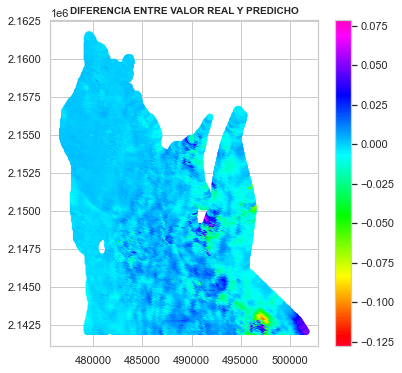

In [168]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [169]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_sup_nor','car_pre_dur_nor','car_pre_inf_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2007_2002_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2007_2002_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,-0.202099,-0.000136,-0.000839
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,-0.114894,0.000275,0.000081
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,-0.367897,-0.001373,0.000250
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,-0.295746,-0.000780,-0.001118
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,-0.216132,-0.000584,0.000439


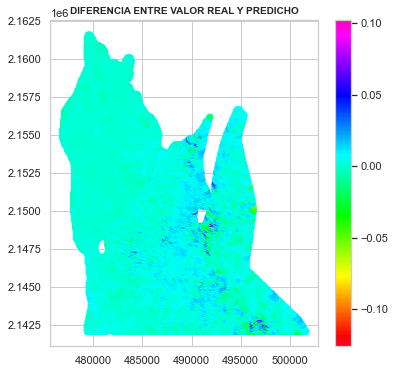

In [170]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [171]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2007_2002']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2007_2002_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,-0.202099,-0.000079,-0.000896
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,-0.114894,-0.000579,0.000935
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,-0.367897,0.001140,-0.002263
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,-0.295746,0.000680,-0.002577
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,-0.216132,0.000201,-0.000346


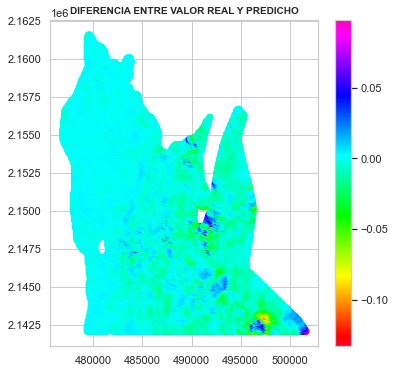

In [172]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes separados año 2007 - 2012 recortado

In [173]:
# Año 2007 - 2012, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_sup,car_pre_dur,car_pre_inf,coe_com_sup,coe_com_dur,coe_com_inf,abat_2012_2007,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.309379,2.507129,2.495002,1.957480,0.152980,0.669202,-0.813150,-0.097276
std,37.050136,0.335447,0.276869,0.560262,1.038798,0.037726,0.223064,4.014440,0.102892
min,0.017483,0.888549,1.915386,1.504945,0.023132,0.066877,0.072937,-18.671072,-0.375125
25%,47.290563,0.960724,2.280297,2.046927,1.064652,0.133699,0.493539,-3.436282,-0.175381
50%,67.353762,1.304631,2.465800,2.287142,1.864751,0.148754,0.660574,-1.219528,-0.065559
75%,119.999996,1.613403,2.697182,2.961173,3.050305,0.172016,0.809236,1.582283,-0.001288
max,120.213670,2.083252,3.540976,4.061701,3.315095,0.341208,1.466186,15.015358,0.014968


In [174]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_sup        0
car_pre_dur        0
car_pre_inf        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2012_2007     0
tasa_hundim       59
dtype: int64

In [175]:
#eliminar los registros vacios
dataset = dataset.dropna()

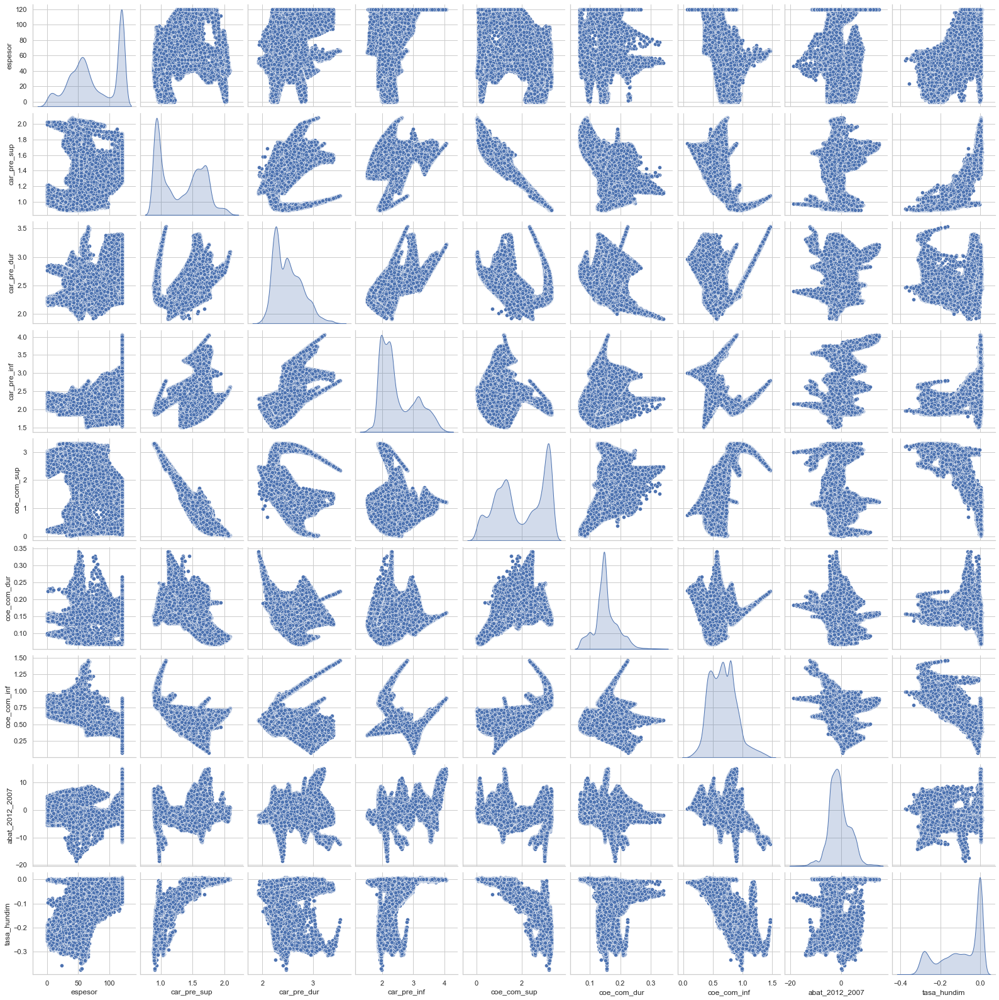

In [176]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007','tasa_hundim']], diag_kind="kde")

In [177]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_sup,23433.0,1.309489,0.335632,0.888549,0.960704,1.304419,1.613111,2.083252
car_pre_dur,23433.0,2.506414,0.276816,1.915386,2.279939,2.465496,2.694900,3.540976
car_pre_inf,23433.0,2.492233,0.558869,1.504945,2.045394,2.286791,2.951977,4.061701
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2012_2007,23433.0,-0.819929,4.009016,-18.671072,-3.435332,-1.225478,1.562070,15.015358


In [178]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [179]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [180]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [181]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000227,0.010939,0.000227,0.977797,0.022203,0.000116,0.007565,0.000116,0.988784,0.011215,4995
4996,0.000225,0.010867,0.000225,0.978208,0.021792,0.000091,0.005183,0.000091,0.991231,0.008769,4996
4997,0.000227,0.010913,0.000227,0.977604,0.022396,0.000142,0.006579,0.000142,0.986486,0.013514,4997
4998,0.000247,0.011607,0.000247,0.975862,0.024138,0.000105,0.005665,0.000105,0.989898,0.010102,4998
4999,0.000224,0.010707,0.000224,0.978226,0.021774,0.000116,0.005706,0.000116,0.988887,0.011113,4999


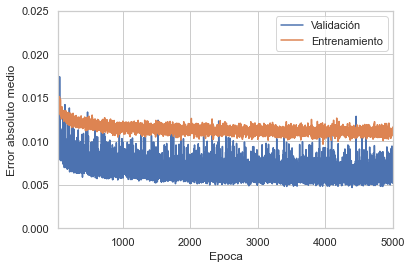

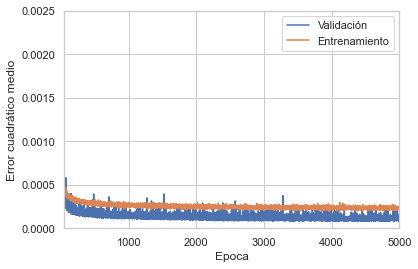

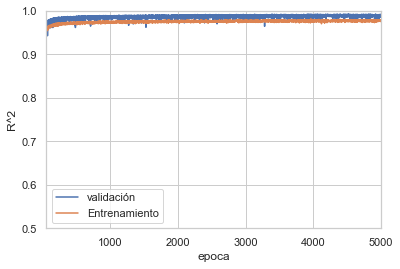

In [182]:
plot_history(history)

In [183]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [184]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000035,0.003485,0.000035,0.996659,0.003340,0.000050,0.003774,0.000050,0.995066,0.004934,4995
4996,0.000038,0.003591,0.000038,0.996362,0.003638,0.000057,0.004535,0.000057,0.994502,0.005498,4996
4997,0.000036,0.003630,0.000036,0.996482,0.003518,0.000044,0.003812,0.000044,0.995673,0.004326,4997
4998,0.000035,0.003491,0.000035,0.996602,0.003398,0.000052,0.004054,0.000052,0.994950,0.005050,4998
4999,0.000035,0.003498,0.000035,0.996659,0.003341,0.000046,0.003845,0.000046,0.995497,0.004503,4999


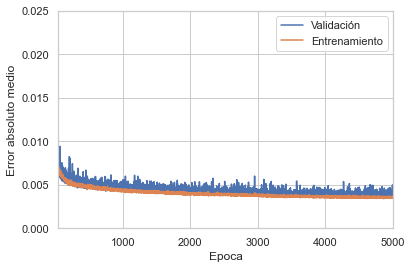

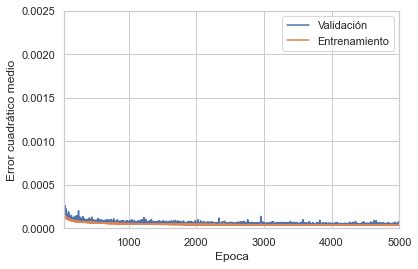

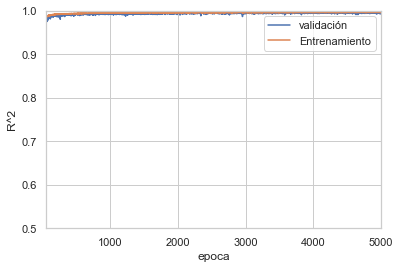

In [185]:
plot_history(history3)

In [186]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [187]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000113,0.006346,0.000113,0.989037,0.010963,0.000082,0.005511,0.000082,0.991993,0.008007,4995
4996,0.000120,0.006495,0.000120,0.988312,0.011688,0.000091,0.005272,0.000091,0.991080,0.008920,4996
4997,0.000117,0.006560,0.000117,0.988415,0.011584,0.000087,0.004943,0.000087,0.991583,0.008417,4997
4998,0.000120,0.006458,0.000120,0.988424,0.011576,0.000086,0.005478,0.000086,0.991647,0.008353,4998
4999,0.000112,0.006398,0.000112,0.989205,0.010795,0.000097,0.005090,0.000097,0.990657,0.009343,4999


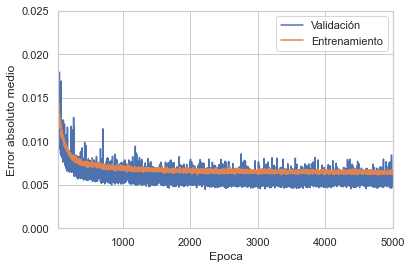

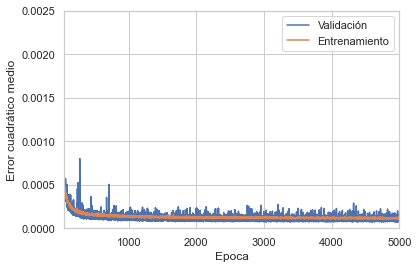

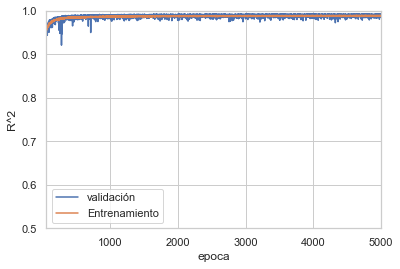

In [188]:
plot_history(history5)

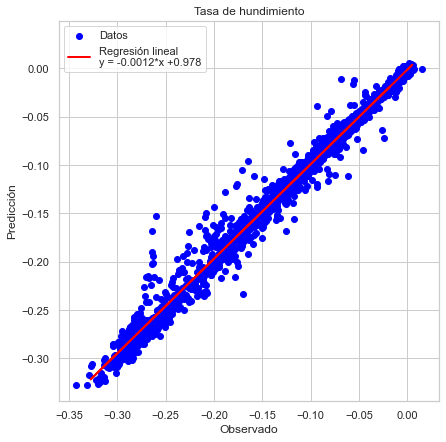

In [189]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

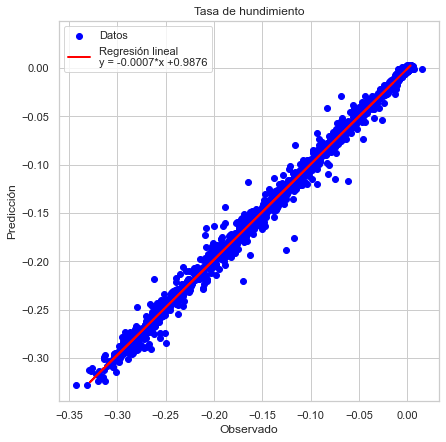

In [190]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

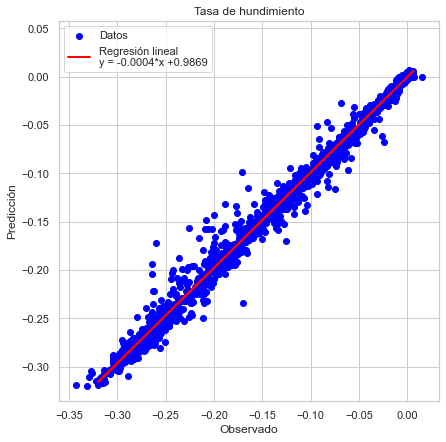

In [191]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [192]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.005607
Mean squared error (MSE):       0.000102
Root mean squared error (RMSE): 0.010092
R square (R^2):                 0.990432


In [193]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.003641
Mean squared error (MSE):       0.000039
Root mean squared error (RMSE): 0.006244
R square (R^2):                 0.996337


In [194]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.004787
Mean squared error (MSE):       0.000074
Root mean squared error (RMSE): 0.008621
R square (R^2):                 0.993018


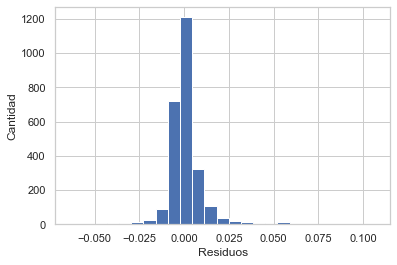

In [195]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

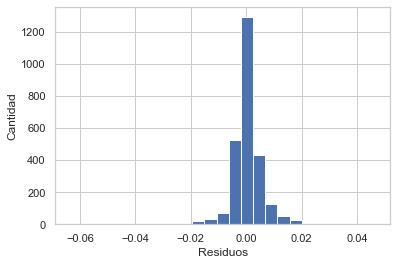

In [196]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

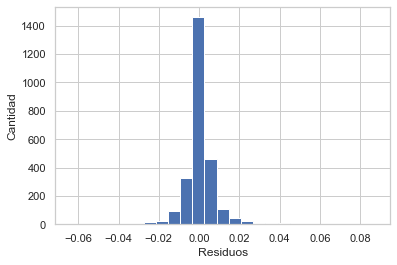

In [197]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [198]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0834 ± 0.0013,car_pre_sup
0.0325 ± 0.0003,coe_com_sup
0.0061 ± 0.0001,car_pre_inf
0.0041 ± 0.0001,espesor
0.0027 ± 0.0001,coe_com_inf
0.0018 ± 0.0000,car_pre_dur
0.0013 ± 0.0001,coe_com_dur
0.0004 ± 0.0000,abat_2012_2007


In [199]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0211 ± 0.0005,car_pre_inf
0.0120 ± 0.0002,coe_com_sup
0.0114 ± 0.0003,coe_com_inf
0.0051 ± 0.0001,car_pre_sup
0.0033 ± 0.0001,coe_com_dur
0.0032 ± 0.0000,espesor
0.0029 ± 0.0000,car_pre_dur
0.0016 ± 0.0001,abat_2012_2007


In [200]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0300 ± 0.0005,coe_com_sup
0.0131 ± 0.0002,car_pre_sup
0.0126 ± 0.0005,car_pre_dur
0.0064 ± 0.0003,car_pre_inf
0.0035 ± 0.0000,espesor
0.0028 ± 0.0001,coe_com_inf
0.0023 ± 0.0001,coe_com_dur
0.0010 ± 0.0000,abat_2012_2007


In [201]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_sup_nor'] = ( dataset_fal2['car_pre_sup'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['car_pre_dur_nor'] = ( dataset_fal2['car_pre_dur'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['car_pre_inf_nor'] = ( dataset_fal2['car_pre_inf'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][5] ) / train_stats['std'] [5]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][6] ) / train_stats['std'] [6]
dataset_fal2['abat_2012_2007_nor'] = ( dataset_fal2['abat_2012_2007'] - train_stats['mean'][7] ) / train_stats['std'] [7]

In [202]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,3.232146,-0.001412,0.000437
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,2.962519,-0.002072,0.002428
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,3.707839,-0.000281,-0.000842
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,3.454796,-0.000972,-0.000926
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,3.188802,-0.001705,0.001560


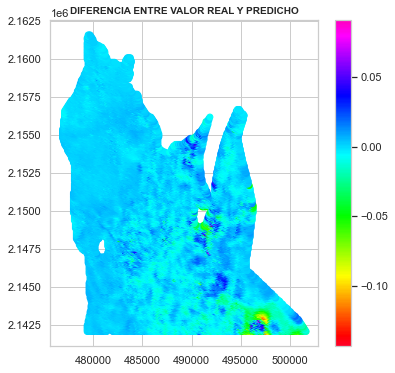

In [203]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [204]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_sup_nor','car_pre_dur_nor','car_pre_inf_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2012_2007_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,3.232146,-0.000317,-0.000658
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,2.962519,-0.000415,0.000771
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,3.707839,-0.001546,0.000423
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,3.454796,-0.001077,-0.000820
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,3.188802,-0.000401,0.000256


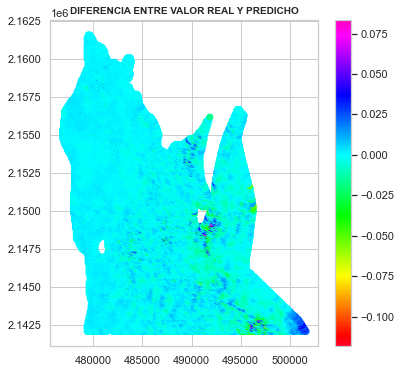

In [205]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [206]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,3.232146,0.000245,-0.001220
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,2.962519,0.000014,0.000342
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,3.707839,-0.001935,0.000813
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,3.454796,-0.000951,-0.000946
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,3.188802,0.000145,-0.000290


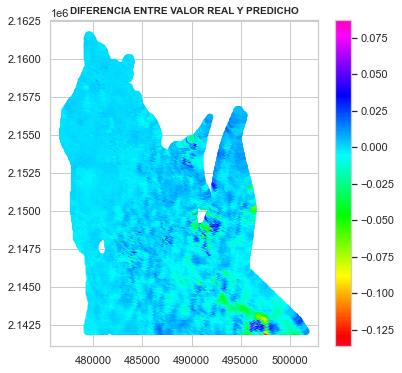

In [207]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes totales año 2012 - 2017 recortado

In [208]:
# Año 1997 - 2002, coef. totales
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_tot','coe_com_tot','abat_2012_2007']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
dataset.describe()

,espesor,car_pre_tot,coe_com_tot,abat_2012_2007,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.836361,2.155248,-0.813150,-0.097276
std,37.050136,0.464849,0.795961,4.014440,0.102892
min,0.017483,1.170159,0.879444,-18.671072,-0.375125
25%,47.290563,1.477711,1.505700,-3.436282,-0.175381
50%,67.353762,1.721343,2.116003,-1.219528,-0.065559
75%,119.999996,2.097508,2.673035,1.582283,-0.001288
max,120.213670,3.371173,5.071804,15.015358,0.014968


In [209]:
dataset.isna().sum()

espesor            0
car_pre_tot        0
coe_com_tot        0
abat_2012_2007     0
tasa_hundim       59
dtype: int64

In [210]:
dataset = dataset.dropna()

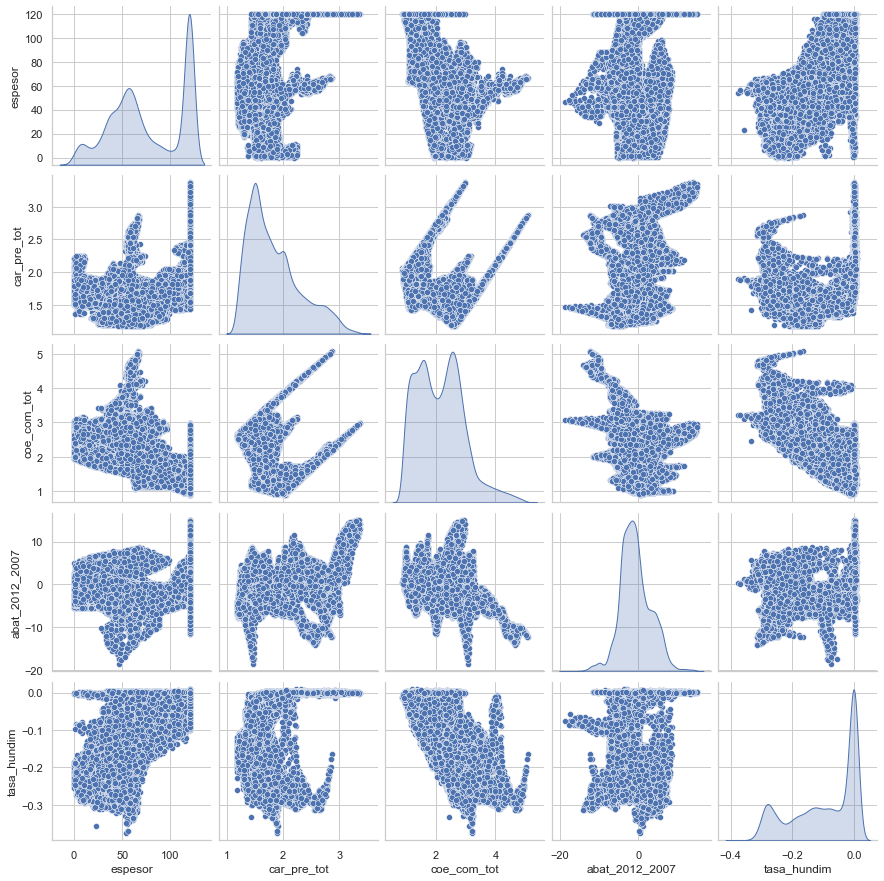

In [211]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_tot','coe_com_tot','abat_2012_2007','tasa_hundim']], diag_kind="kde")

In [212]:
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_tot,23433.0,1.833796,0.463718,1.170159,1.477536,1.717742,2.091847,3.371173
coe_com_tot,23433.0,2.154213,0.793985,0.879444,1.507328,2.116764,2.671197,5.071804
abat_2012_2007,23433.0,-0.819929,4.009016,-18.671072,-3.435332,-1.225478,1.562070,15.015358


In [213]:
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [214]:
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

normed_train_data = norm(train_dataset) 
normed_test_data = norm(test_dataset)

In [215]:
def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    

  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)


In [216]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000626,0.016534,0.000626,0.939593,0.060407,0.000481,0.011867,0.000481,0.953550,0.046450,4995
4996,0.000642,0.016933,0.000642,0.937476,0.062524,0.000465,0.011057,0.000465,0.955234,0.044766,4996
4997,0.000630,0.016662,0.000630,0.938769,0.061230,0.000549,0.012008,0.000549,0.946761,0.053239,4997
4998,0.000638,0.016840,0.000638,0.937916,0.062084,0.000517,0.011519,0.000517,0.950458,0.049542,4998
4999,0.000698,0.017578,0.000698,0.932314,0.067686,0.000534,0.012545,0.000534,0.949311,0.050689,4999


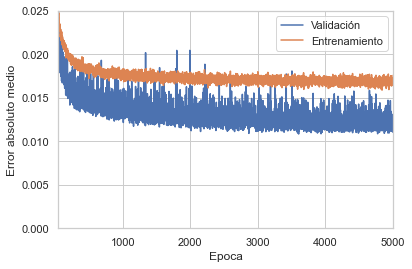

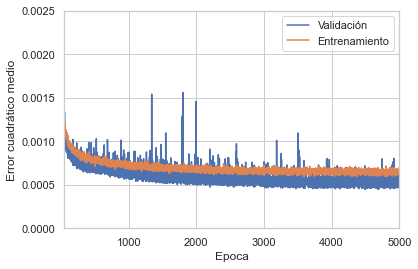

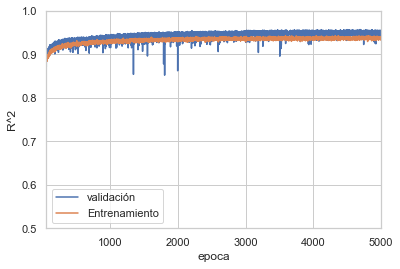

In [217]:
plot_history(history)

In [218]:
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [219]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000085,0.005715,0.000085,0.991757,0.008243,0.000135,0.006620,0.000135,0.986870,0.013130,4995
4996,0.000083,0.005628,0.000083,0.991980,0.008020,0.000139,0.006250,0.000139,0.986498,0.013502,4996
4997,0.000085,0.005719,0.000085,0.991800,0.008200,0.000115,0.006066,0.000115,0.988888,0.011112,4997
4998,0.000085,0.005659,0.000085,0.991814,0.008186,0.000126,0.006622,0.000126,0.987939,0.012061,4998
4999,0.000090,0.005841,0.000090,0.991249,0.008751,0.000129,0.006052,0.000129,0.987616,0.012384,4999


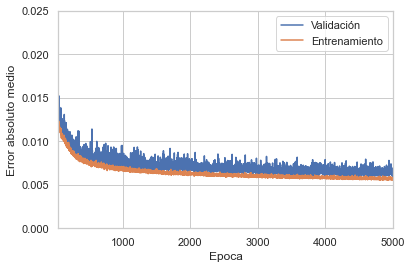

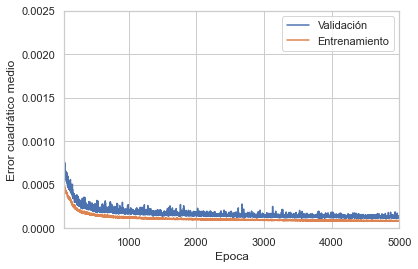

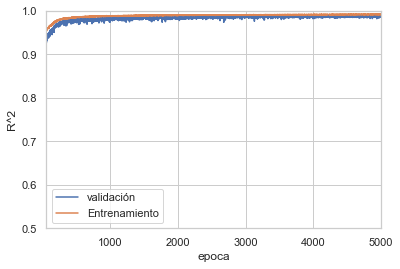

In [220]:
plot_history(history3)

In [221]:
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [222]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000541,0.013986,0.000541,0.947602,0.052398,0.000497,0.011201,0.000497,0.952073,0.047927,4995
4996,0.000521,0.013707,0.000521,0.949671,0.050329,0.000526,0.011468,0.000526,0.949388,0.050612,4996
4997,0.000526,0.013833,0.000526,0.948828,0.051172,0.000489,0.011386,0.000489,0.952969,0.047031,4997
4998,0.000535,0.013809,0.000535,0.948319,0.051681,0.000573,0.011426,0.000573,0.944337,0.055663,4998
4999,0.000557,0.013934,0.000557,0.946332,0.053668,0.000511,0.012017,0.000511,0.950672,0.049328,4999


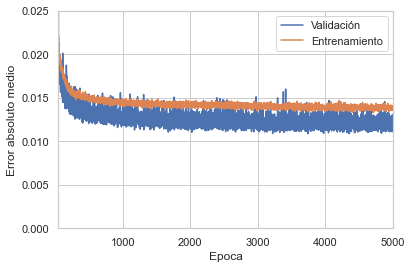

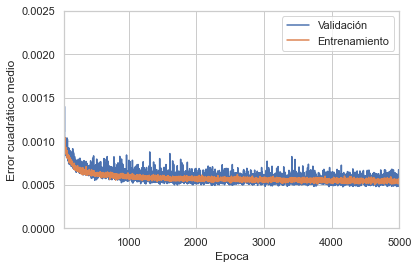

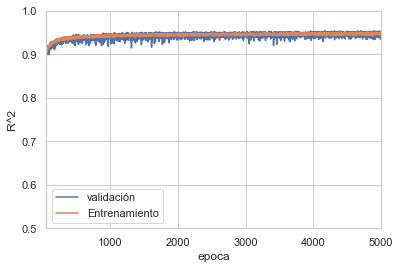

In [223]:
plot_history(history5)

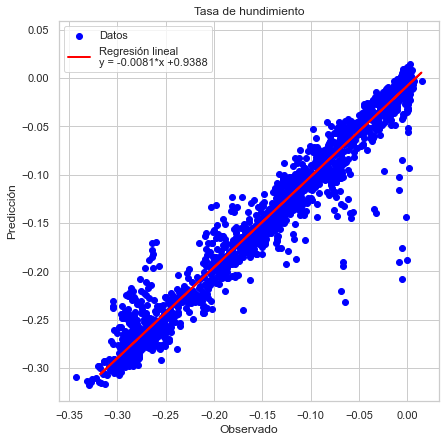

In [224]:
y_test = np.array((test_labels)).reshape(-1,1)
  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

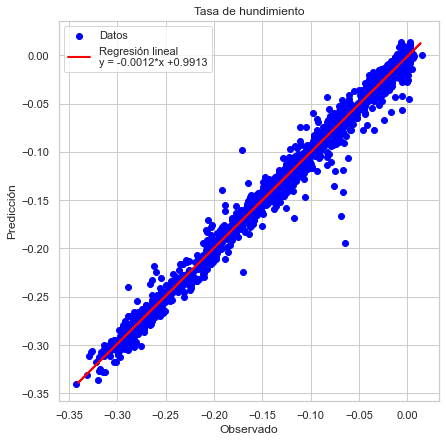

In [225]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

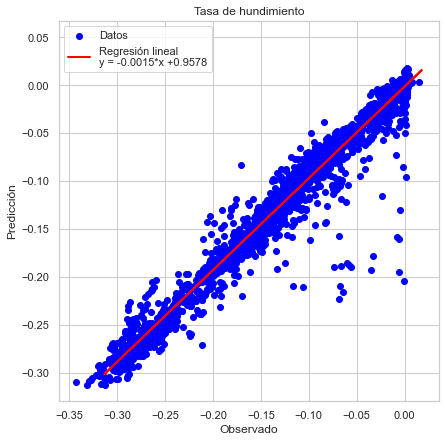

In [226]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [227]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.011318
Mean squared error (MSE):       0.000368
Root mean squared error (RMSE): 0.019174
R square (R^2):                 0.965460


In [228]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.005467
Mean squared error (MSE):       0.000083
Root mean squared error (RMSE): 0.009089
R square (R^2):                 0.992239


In [229]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.010498
Mean squared error (MSE):       0.000344
Root mean squared error (RMSE): 0.018537
R square (R^2):                 0.967718


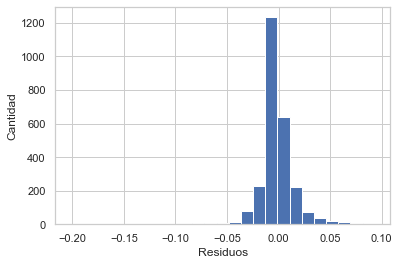

In [230]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

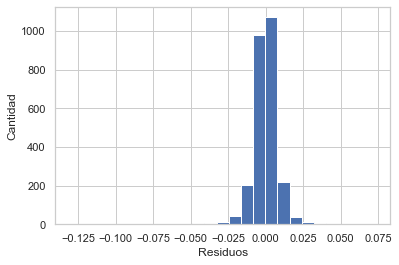

In [231]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

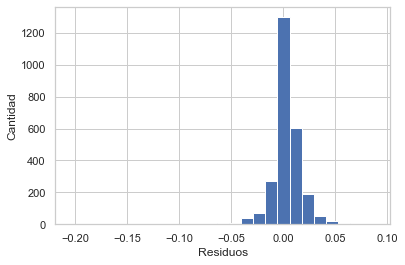

In [232]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [233]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0371 ± 0.0016,car_pre_tot
0.0240 ± 0.0007,coe_com_tot
0.0077 ± 0.0001,espesor
0.0034 ± 0.0001,abat_2012_2007


In [234]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0552 ± 0.0018,coe_com_tot
0.0539 ± 0.0019,car_pre_tot
0.0120 ± 0.0003,espesor
0.0044 ± 0.0001,abat_2012_2007


In [235]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0145 ± 0.0002,car_pre_tot
0.0141 ± 0.0003,coe_com_tot
0.0064 ± 0.0001,espesor
0.0032 ± 0.0001,abat_2012_2007


In [236]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_tot_nor'] = ( dataset_fal2['car_pre_tot'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['coe_com_tot_nor'] = ( dataset_fal2['coe_com_tot'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['abat_2012_2007_nor'] = ( dataset_fal2['abat_2012_2007'] - train_stats['mean'][3] ) / train_stats['std'] [3]

In [237]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,3.232146,-0.002762,0.001786
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,2.962519,-0.004403,0.004758
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,3.707839,0.000145,-0.001268
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,3.454796,-0.001396,-0.000501
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,3.188802,-0.003015,0.002870


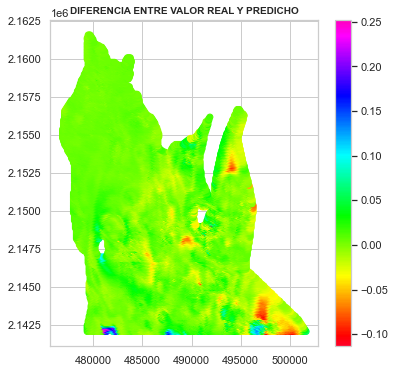

In [238]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [239]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_tot_nor','coe_com_tot_nor','abat_2012_2007_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,3.232146,-0.003583,0.002608
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,2.962519,-0.004006,0.004362
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,3.707839,-0.003109,0.001986
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,3.454796,-0.003491,0.001593
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,3.188802,-0.003904,0.003760


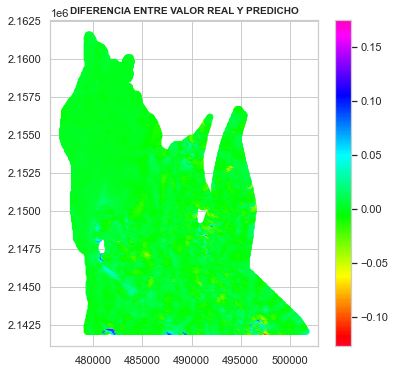

In [240]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [241]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_tot','coe_com_tot','abat_2012_2007']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,abat_2012_2007,abat_2017_2012,tasa_hundim,Recortar mayores a 2142097,espesor_nor,car_pre_tot_nor,coe_com_tot_nor,abat_2012_2007_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,12.137798,3.839227,-0.000975,NaN,1.206084,3.243958,0.997283,3.232146,0.005385,-0.006360
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,11.056859,3.719560,0.000356,NaN,1.206143,3.223575,0.984724,2.962519,0.006899,-0.006543
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,14.044859,4.455206,-0.001123,NaN,1.206251,3.315324,1.050469,3.707839,0.004535,-0.005658
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,13.030405,4.412997,-0.001897,NaN,1.206185,3.294751,1.037564,3.454796,0.005887,-0.007784
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,11.964030,4.347893,-0.000145,NaN,1.206213,3.274304,1.024876,3.188802,0.007363,-0.007508


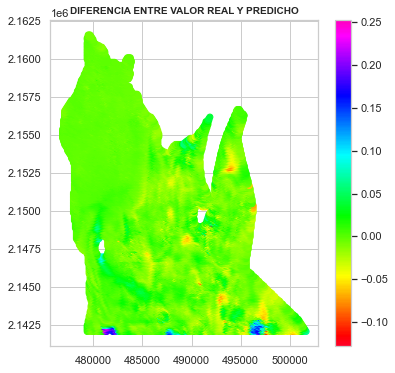

In [242]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

# Predecir con coeficientes separados año 2012 - 2017 recortado

In [243]:
# Año 2012 - 2017, coef. separados zona recortada
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path, na_values = "?", comment='\t', sep=";", skipinitialspace=True)
x_label = ['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012']
y_label = ['tasa_hundim']
dataset = raw_dataset[ x_label+y_label].copy()
#dataset.tail()
dataset.describe()

,espesor,car_pre_sup,car_pre_dur,car_pre_inf,coe_com_sup,coe_com_dur,coe_com_inf,abat_2017_2012,tasa_hundim
count,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26096.000000,26037.000000
mean,75.521731,1.309379,2.507129,2.495002,1.957480,0.152980,0.669202,-2.263112,-0.097276
std,37.050136,0.335447,0.276869,0.560262,1.038798,0.037726,0.223064,4.740624,0.102892
min,0.017483,0.888549,1.915386,1.504945,0.023132,0.066877,0.072937,-16.670722,-0.375125
25%,47.290563,0.960724,2.280297,2.046927,1.064652,0.133699,0.493539,-5.233589,-0.175381
50%,67.353762,1.304631,2.465800,2.287142,1.864751,0.148754,0.660574,-2.630130,-0.065559
75%,119.999996,1.613403,2.697182,2.961173,3.050305,0.172016,0.809236,-0.039636,-0.001288
max,120.213670,2.083252,3.540976,4.061701,3.315095,0.341208,1.466186,25.756381,0.014968


In [244]:
#contar la cantidad de datos en cada columna que está vacío
dataset.isna().sum()

espesor            0
car_pre_sup        0
car_pre_dur        0
car_pre_inf        0
coe_com_sup        0
coe_com_dur        0
coe_com_inf        0
abat_2017_2012     0
tasa_hundim       59
dtype: int64

In [245]:
#eliminar los registros vacios
dataset = dataset.dropna()

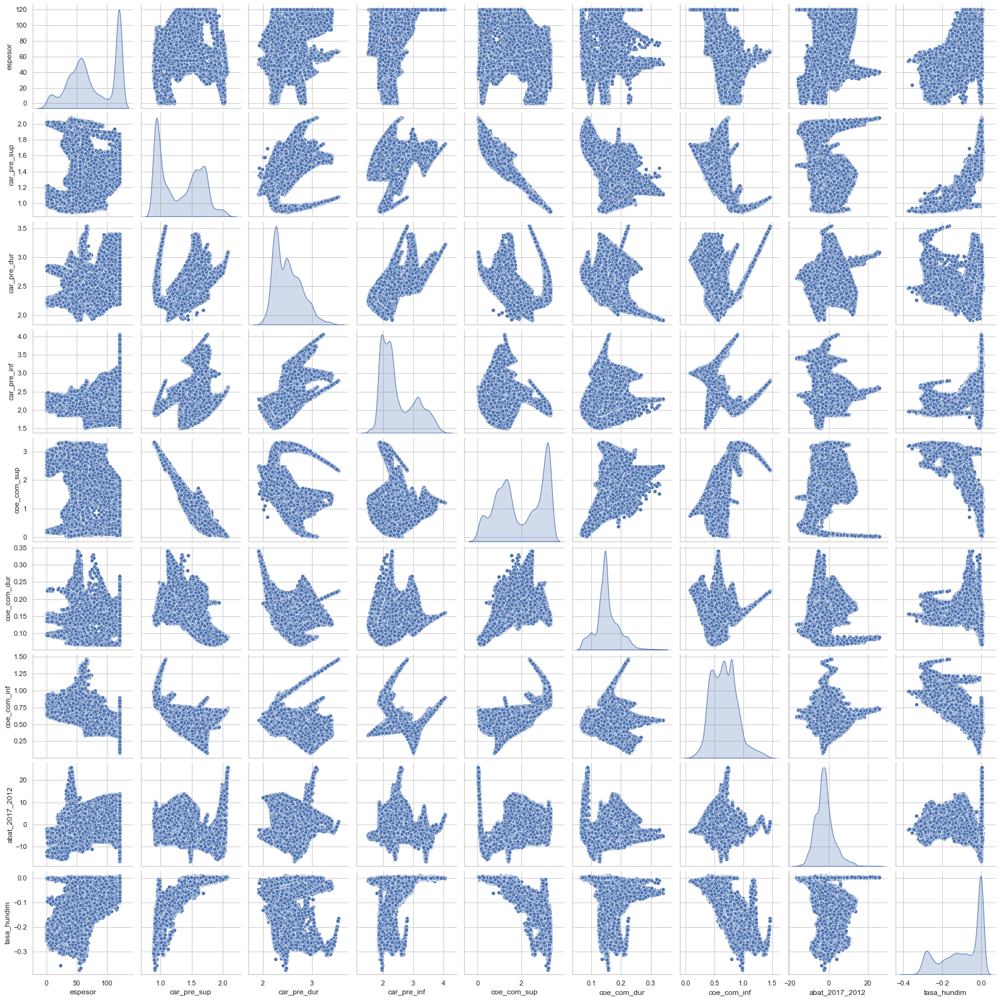

In [246]:
train_dataset = dataset.sample(frac=0.90,random_state=0)
test_dataset = dataset.drop(train_dataset.index)
sns.pairplot(train_dataset[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012','tasa_hundim']], diag_kind="kde")

In [247]:
#sacar las estadísticas de los datos usados para entrenar (solo de los features que se usarán)
train_stats = train_dataset.describe()
train_stats.pop('tasa_hundim')
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
espesor,23433.0,75.344579,37.024539,0.017483,47.086800,67.316113,119.999996,120.213670
car_pre_sup,23433.0,1.309489,0.335632,0.888549,0.960704,1.304419,1.613111,2.083252
car_pre_dur,23433.0,2.506414,0.276816,1.915386,2.279939,2.465496,2.694900,3.540976
car_pre_inf,23433.0,2.492233,0.558869,1.504945,2.045394,2.286791,2.951977,4.061701
coe_com_sup,23433.0,1.957017,1.039139,0.023132,1.066186,1.865777,3.050716,3.315095
coe_com_dur,23433.0,0.152864,0.037786,0.066877,0.133537,0.148691,0.171835,0.341208
coe_com_inf,23433.0,0.669021,0.222417,0.072937,0.493968,0.660331,0.808885,1.466186
abat_2017_2012,23433.0,-2.244427,4.766369,-16.670722,-5.239721,-2.604828,-0.004097,25.756381


In [248]:
#separar los labels de los datos de entrenamiento y test, el restante train_dataset y test_dataset queda sin esa última columna
train_labels = train_dataset.pop('tasa_hundim')
test_labels = test_dataset.pop('tasa_hundim')

In [249]:
#función para normalizar los datos, restar la media aritmética de los datos de entrenamiento, y dividir por la desviación 
#estandar de los mismos datos
def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

#normalizar los datos de entrada de entrenamiento y test
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [250]:
#definir la red neuronal que se usará, Batchnormalization en todas las capas

def build_model():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(1)
  ])
    
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
                #msee = mse = loss, mae = rmse
  return model

EPOCHS = 5000
model = KerasRegressor(build_fn=build_model, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history = model.fit(train_dataset, train_labels)

In [251]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000248,0.011774,0.000248,0.975885,0.024115,0.000103,0.005846,0.000103,0.989861,0.010139,4995
4996,0.000208,0.010660,0.000208,0.979689,0.020311,0.000074,0.004762,0.000074,0.992785,0.007215,4996
4997,0.000221,0.011088,0.000221,0.978556,0.021444,0.000080,0.005909,0.000080,0.992058,0.007942,4997
4998,0.000200,0.010675,0.000200,0.980704,0.019296,0.000082,0.005359,0.000082,0.991946,0.008054,4998
4999,0.000211,0.010897,0.000211,0.979516,0.020484,0.000081,0.005102,0.000081,0.992050,0.007950,4999


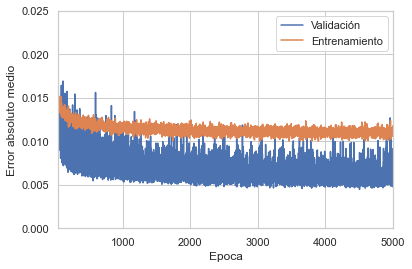

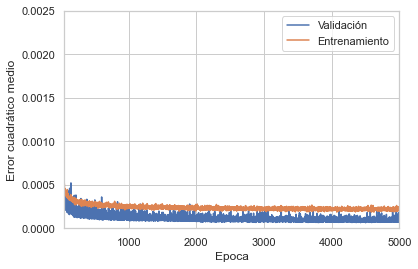

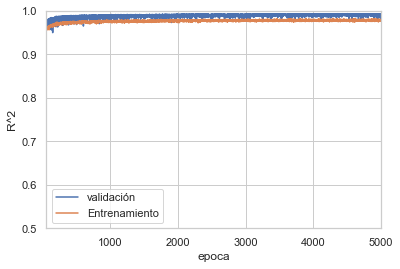

In [252]:
plot_history(history)

In [253]:
# Normalización normal a la entrada
def build_model3():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(normed_train_data.keys())]),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])

  return model

EPOCHS = 5000
model3= KerasRegressor(build_fn=build_model3, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history3= model3.fit(normed_train_data, train_labels)

In [254]:
hist = pd.DataFrame(history3.history)
hist['epoch'] = history3.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000034,0.003580,0.000034,0.996733,0.003266,0.000042,0.003811,0.000042,0.995894,0.004106,4995
4996,0.000033,0.003507,0.000033,0.996804,0.003196,0.000041,0.003688,0.000041,0.995961,0.004039,4996
4997,0.000034,0.003548,0.000034,0.996761,0.003239,0.000043,0.004021,0.000043,0.995745,0.004255,4997
4998,0.000033,0.003500,0.000033,0.996782,0.003218,0.000040,0.003767,0.000040,0.996107,0.003893,4998
4999,0.000036,0.003603,0.000036,0.996583,0.003417,0.000041,0.003901,0.000041,0.995972,0.004028,4999


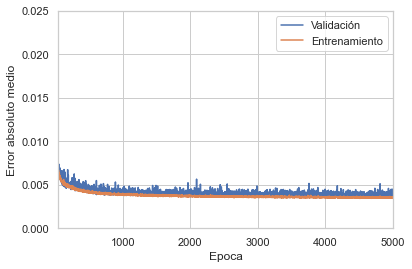

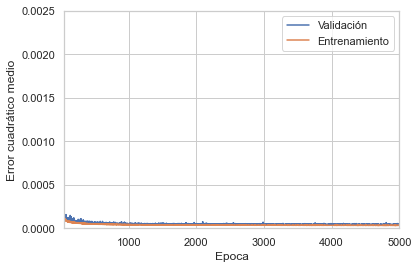

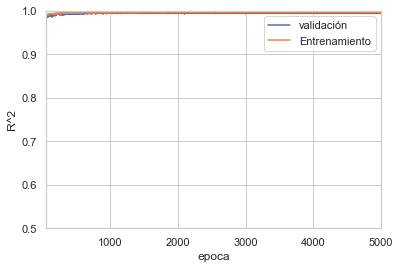

In [255]:
plot_history(history3)

In [256]:
# Batchnormalization en todas las capas menos en la última
def build_model5():
  model = keras.Sequential([
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
    layers.BatchNormalization(),
    layers.Dense(8, activation='relu'),
    layers.Dense(1)
  ])
  
  model.compile(loss='mse',
                optimizer='adam',
                metrics=['mae','mse', r_square,r_square_loss])
  return model

EPOCHS = 5000
model5= KerasRegressor(build_fn=build_model5, validation_split = 0.1, batch_size=100, epochs=EPOCHS, verbose=0)
history5 = model5.fit(train_dataset, train_labels)

In [257]:
hist = pd.DataFrame(history5.history)
hist['epoch'] = history5.epoch
hist.tail()

,loss,mae,mse,r_square,r_square_loss,val_loss,val_mae,val_mse,val_r_square,val_r_square_loss,epoch
4995,0.000105,0.006226,0.000105,0.989686,0.010314,0.000138,0.005873,0.000138,0.986381,0.013619,4995
4996,0.000097,0.006008,0.000097,0.990620,0.009380,0.000088,0.005894,0.000088,0.991378,0.008622,4996
4997,0.000103,0.006137,0.000103,0.990107,0.009893,0.000072,0.004893,0.000072,0.993028,0.006972,4997
4998,0.000107,0.006373,0.000107,0.989587,0.010413,0.000068,0.004986,0.000068,0.993313,0.006687,4998
4999,0.000105,0.006237,0.000105,0.989814,0.010186,0.000064,0.004436,0.000064,0.993722,0.006278,4999


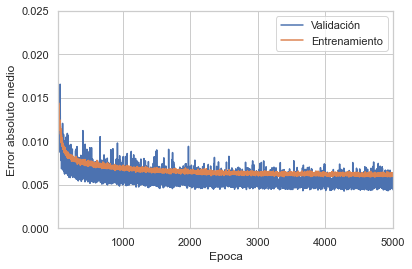

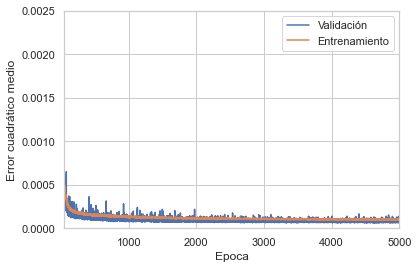

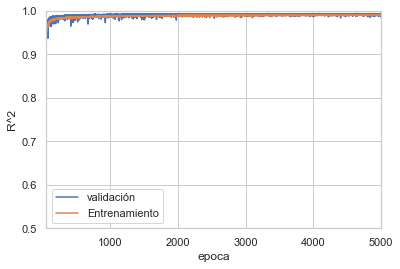

In [258]:
plot_history(history5)

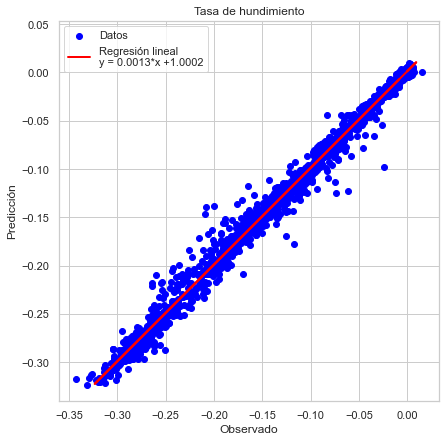

In [259]:
y_test = np.array((test_labels)).reshape(-1,1)

#from sklearn.linear_model import LinearRegression  
regressor = LinearRegression()  
regressor.fit(y_test, model.predict(test_dataset))  
y_fit = regressor.predict(model.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

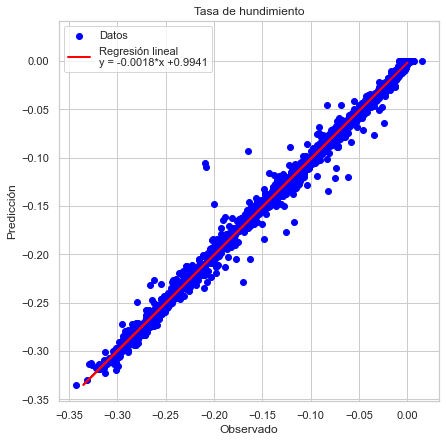

In [260]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model3.predict(normed_test_data))  
y_fit = regressor.predict(model3.predict(normed_test_data).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model3.predict(normed_test_data), color='blue', label= 'Datos')
plt.plot(model3.predict(normed_test_data), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

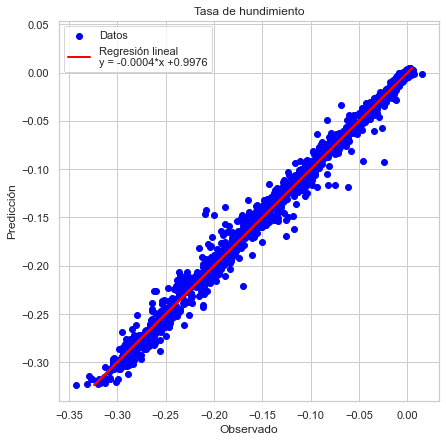

In [261]:
y_test = np.array((test_labels)).reshape(-1,1)

regressor = LinearRegression()  
regressor.fit(y_test, model5.predict(test_dataset))  
y_fit = regressor.predict(model5.predict(test_dataset).reshape(-1,1)) 
   
reg_intercept = round(regressor.intercept_,4)
reg_coef = round(regressor.coef_.flatten()[0],4)
reg_label = "y = " + str(reg_intercept) + "*x +" + str(reg_coef)

plt.figure(figsize=(7,7))
plt.scatter(y_test, model5.predict(test_dataset), color='blue', label= 'Datos')
plt.plot(model5.predict(test_dataset), y_fit, color='red', linewidth=2, label = 'Regresión lineal\n'+reg_label) 
plt.title('Tasa de hundimiento')
plt.legend()
plt.xlabel('Observado')
plt.ylabel('Predicción')
plt.axis('equal')
plt.axis('square')
plt.show()

In [262]:
# print statistical figures of merit

#import sklearn.metrics, math
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model.predict(test_dataset)))

Mean absolute error (MAE):      0.004997
Mean squared error (MSE):       0.000070
Root mean squared error (RMSE): 0.008338
R square (R^2):                 0.993469


In [263]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model3.predict(normed_test_data)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model3.predict(normed_test_data))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model3.predict(normed_test_data)))

Mean absolute error (MAE):      0.003992
Mean squared error (MSE):       0.000049
Root mean squared error (RMSE): 0.007034
R square (R^2):                 0.995352


In [264]:
# print statistical figures of merit
print("Mean absolute error (MAE):      %f" % sklearn.metrics.mean_absolute_error(y_test,model5.predict(test_dataset)))
print("Mean squared error (MSE):       %f" % sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset)))
print("Root mean squared error (RMSE): %f" % math.sqrt(sklearn.metrics.mean_squared_error(y_test,model5.predict(test_dataset))))
print("R square (R^2):                 %f" % sklearn.metrics.r2_score(y_test,model5.predict(test_dataset)))

Mean absolute error (MAE):      0.004397
Mean squared error (MSE):       0.000056
Root mean squared error (RMSE): 0.007485
R square (R^2):                 0.994736


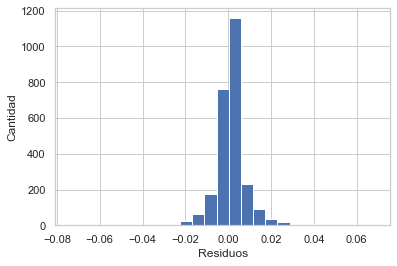

In [265]:
# hisotgrama con los valores de errores
error = model.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

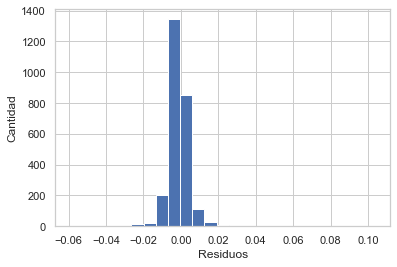

In [266]:
# hisotgrama con los valores de errores
error = model3.predict(normed_test_data) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

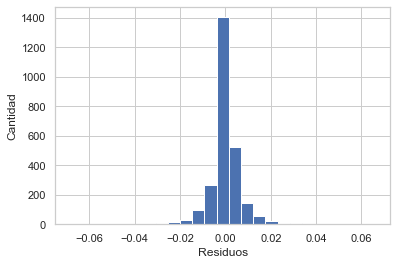

In [267]:
# hisotgrama con los valores de errores
error = model5.predict(test_dataset) - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Residuos")
_ = plt.ylabel("Cantidad")

In [268]:
perm = PermutationImportance(model, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.1435 ± 0.0034,car_pre_sup
0.0757 ± 0.0016,coe_com_sup
0.0249 ± 0.0008,car_pre_inf
0.0051 ± 0.0001,coe_com_inf
0.0032 ± 0.0001,espesor
0.0023 ± 0.0001,coe_com_dur
0.0021 ± 0.0001,car_pre_dur
0.0008 ± 0.0000,abat_2017_2012


In [269]:
perm = PermutationImportance(model3, random_state=1).fit(normed_train_data, train_labels)
eli5.show_weights(perm, feature_names = normed_train_data.columns.tolist())

Weight,Feature
0.0122 ± 0.0002,car_pre_inf
0.0115 ± 0.0010,coe_com_inf
0.0094 ± 0.0003,car_pre_dur
0.0055 ± 0.0001,car_pre_sup
0.0047 ± 0.0002,espesor
0.0042 ± 0.0001,coe_com_dur
0.0037 ± 0.0001,coe_com_sup
0.0017 ± 0.0000,abat_2017_2012


In [270]:
perm = PermutationImportance(model5, random_state=1).fit(train_dataset, train_labels)
eli5.show_weights(perm, feature_names = train_dataset.columns.tolist())

Weight,Feature
0.0312 ± 0.0011,car_pre_inf
0.0254 ± 0.0003,car_pre_sup
0.0160 ± 0.0003,coe_com_sup
0.0069 ± 0.0002,coe_com_dur
0.0054 ± 0.0001,car_pre_dur
0.0048 ± 0.0001,coe_com_inf
0.0035 ± 0.0000,espesor
0.0009 ± 0.0000,abat_2017_2012


In [271]:
dataset_path = 'Todos_los_datos_zona_EspLitPos_sin_coordenadas_en_todas_las_variables_zona_norte.csv'
raw_dataset = pd.read_csv(dataset_path,na_values = "?", comment='\t',sep=";", skipinitialspace=True)
dataset_fal2 = raw_dataset.copy()
#dataset_fal2 = dataset_fal2.dropna()

dataset_fal2['espesor_nor'] = ( dataset_fal2['espesor'] - train_stats['mean'][0] ) / train_stats['std'] [0]
dataset_fal2['car_pre_sup_nor'] = ( dataset_fal2['car_pre_sup'] - train_stats['mean'][1] ) / train_stats['std'] [1]
dataset_fal2['car_pre_dur_nor'] = ( dataset_fal2['car_pre_dur'] - train_stats['mean'][2] ) / train_stats['std'] [2]
dataset_fal2['car_pre_inf_nor'] = ( dataset_fal2['car_pre_inf'] - train_stats['mean'][3] ) / train_stats['std'] [3]
dataset_fal2['coe_com_sup_nor'] = ( dataset_fal2['coe_com_sup'] - train_stats['mean'][4] ) / train_stats['std'] [4]
dataset_fal2['coe_com_dur_nor'] = ( dataset_fal2['coe_com_dur'] - train_stats['mean'][5] ) / train_stats['std'] [5]
dataset_fal2['coe_com_inf_nor'] = ( dataset_fal2['coe_com_inf'] - train_stats['mean'][6] ) / train_stats['std'] [6]
dataset_fal2['abat_2017_2012_nor'] = ( dataset_fal2['abat_2017_2012'] - train_stats['mean'][7] ) / train_stats['std'] [7]

In [272]:
dataset_fal2['prediction'] = model.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2017_2012_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.276371,0.000717,-0.001693
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.251264,0.000811,-0.000456
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.405605,0.000676,-0.001799
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.396749,0.000852,-0.002749
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.383091,0.001003,-0.001148


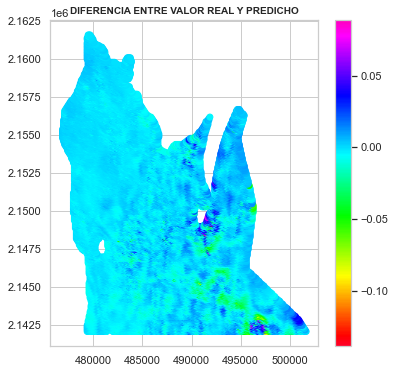

In [273]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [274]:
dataset_fal2['prediction'] = model3.predict(dataset_fal2[['espesor_nor','car_pre_sup_nor','car_pre_dur_nor','car_pre_inf_nor','coe_com_sup_nor','coe_com_dur_nor','coe_com_inf_nor','abat_2017_2012_nor']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2017_2012_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.276371,0.000268,-0.001244
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.251264,0.000268,0.000088
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.405605,0.000268,-0.001391
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.396749,0.000268,-0.002166
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.383091,0.000268,-0.000413


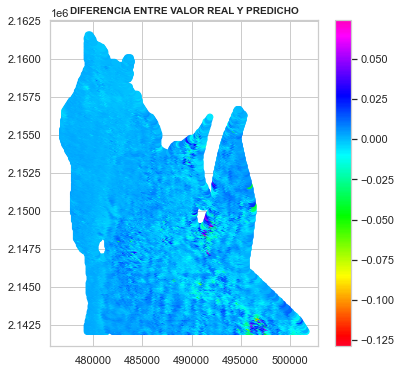

In [275]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()

In [276]:
dataset_fal2['prediction'] = model5.predict(dataset_fal2[['espesor','car_pre_sup','car_pre_dur','car_pre_inf','coe_com_sup','coe_com_dur','coe_com_inf','abat_2017_2012']]) 
dataset_fal2['error_prediction'] = dataset_fal2['tasa_hundim']- dataset_fal2['prediction']
dataset_fal2.tail()

,x,y,espesor,coe_com_tot,coe_com_sup,coe_com_inf,coe_com_dur,error_coe_com_tot,error_coe_com_sup,error_coe_com_inf,...,espesor_nor,car_pre_sup_nor,car_pre_dur_nor,car_pre_inf_nor,coe_com_sup_nor,coe_com_dur_nor,coe_com_inf_nor,abat_2017_2012_nor,prediction,error_prediction
26091,479667,2161497,119.999266,2.946040,1.225358,0.888263,0.159349,1.163466,1.390853,0.197189,...,1.206084,1.281949,2.487441,2.755842,-0.704101,0.171631,0.985729,1.276371,0.003169,-0.004144
26092,479767,2161497,120.001479,2.936069,1.228212,0.885706,0.158946,1.159221,1.389423,0.196952,...,1.206143,1.267832,2.451185,2.739619,-0.701354,0.160962,0.974231,1.251264,0.003067,-0.002711
26093,479467,2161597,120.005454,2.988269,1.216280,0.899634,0.160716,1.179362,1.394414,0.199677,...,1.206251,1.324738,2.596515,2.808291,-0.712838,0.207808,1.036850,1.405605,0.003570,-0.004693
26094,479567,2161597,120.003015,2.978023,1.219363,0.897001,0.160316,1.175048,1.393178,0.199401,...,1.206185,1.310225,2.559659,2.791978,-0.709871,0.197201,1.025016,1.396749,0.003590,-0.005488
26095,479667,2161597,120.004058,2.967949,1.222291,0.894415,0.159915,1.170782,1.391819,0.199146,...,1.206213,1.295946,2.523104,2.775705,-0.707053,0.186601,1.013389,1.383091,0.003585,-0.003730


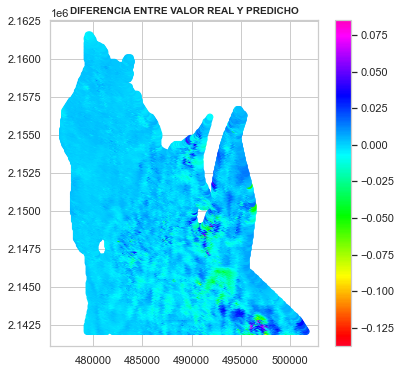

In [277]:
plt.figure(figsize=(6,6))
plt.scatter(dataset_fal2['x'], dataset_fal2['y'], c=dataset_fal2['error_prediction'], cmap = 'gist_rainbow')
plt.title(("DIFERENCIA ENTRE VALOR REAL Y PREDICHO"), fontweight="bold", fontsize=10)
plt.colorbar()